In [ ]:

import numpy as np
from typing import List, Union, Tuple, Dict
from mealpy.utils.agent import Agent
from mealpy.utils.problem import Problem
from math import gamma
from mealpy.utils.history import History
from mealpy.utils.target import Target
from mealpy.utils.termination import Termination
from mealpy.utils.logger import Logger
from mealpy.utils.validator import Validator
import concurrent.futures as parallel
from functools import partial
import os
import time

class Optimizer:
    """
    The base class of all algorithms. All methods in this class will be inherited

    Notes
    ~~~~~
    + The function solve() is the most important method, trained the model
    + The parallel (multithreading or multiprocessing) is used in method: generate_population(), update_target_for_population()
    + The general format of:
        + population = [agent_1, agent_2, ..., agent_N]
        + agent = [solution, target]
        + target = [fitness value, objective_list]
        + objective_list = [obj_1, obj_2, ..., obj_M]
    """

    EPSILON = 10E-10
    SUPPORTED_MODES = ["process", "thread", "swarm", "single"]
    AVAILABLE_MODES = ["process", "thread", "swarm"]
    PARALLEL_MODES = ["process", "thread"]
    SUPPORTED_ARRAYS = [list, tuple, np.ndarray]

    def __init__(self, **kwargs):
        super(Optimizer, self).__init__()
        self.epoch, self.pop_size = None, None
        self.mode, self.n_workers, self.name = None, None, None
        self.pop, self.g_best, self.g_worst = None, Agent(), None
        self.problem, self.logger, self.history = None, None, None
        self.__set_keyword_arguments(kwargs)
        self.validator = Validator(log_to="console", log_file=None)
        self.qubits = None
        self.FEs = None

        if self.name is None: self.name = self.__class__.__name__
        self.sort_flag = False
        self.nfe_counter = -1  # The first one is tested in Problem class
        self.parameters, self.params_name_ordered = {}, None
        self.is_parallelizable = True

    def __set_keyword_arguments(self, kwargs):
        for key, value in kwargs.items():
            setattr(self, key, value)

    def set_parameters(self, parameters: Union[List, Tuple, Dict]) -> None:
        """
        Set the parameters for current optimizer.

        if paras is a list of parameter's name, then it will set the default value in optimizer as current parameters
        if paras is a dict of parameter's name and value, then it will override the current parameters

        Args:
            parameters: The parameters
        """
        if type(parameters) in (list, tuple):
            self.params_name_ordered = tuple(parameters)
            self.parameters = {}
            for name in parameters:
                self.parameters[name] = self.__dict__[name]

        if type(parameters) is dict:
            valid_para_names = set(self.parameters.keys())
            new_para_names = set(parameters.keys())
            if new_para_names.issubset(valid_para_names):
                for key, value in parameters.items():
                    setattr(self, key, value)
                    self.parameters[key] = value
            else:
                raise ValueError(f"Invalid input parameters: {new_para_names} for {self.get_name()} optimizer. "
                                 f"Valid parameters are: {valid_para_names}.")

    def get_parameters(self) -> Dict:
        """
        Get parameters of optimizer.
        """
        return self.parameters

    def get_attributes(self) -> Dict:
        """
        Get all attributes in optimizer.
        """
        return self.__dict__

    def get_name(self) -> str:
        """
        Get name of the optimizer
        """
        return self.name

    def __str__(self):
        temp = ""
        for key in self.params_name_ordered:
            temp += f"{key}={self.parameters[key]}, "
        temp = temp[:-2]
        return f"{self.__class__.__name__}({temp})"

    def initialize_variables(self):
        pass

    def before_initialization(self, starting_solutions: Union[List, Tuple, np.ndarray] = None) -> None:
        """
        Args:
            starting_solutions: The starting solutions (not recommended)
        """
        if starting_solutions is None:
            pass
        elif type(starting_solutions) in self.SUPPORTED_ARRAYS and len(starting_solutions) == self.pop_size:
            if type(starting_solutions[0]) in self.SUPPORTED_ARRAYS and len(starting_solutions[0]) == self.problem.n_dims:
                self.pop = [self.generate_agent(solution) for solution in starting_solutions]
            else:
                raise ValueError("Invalid starting_solutions. It should be a list of positions or 2D matrix of positions only.")
        else:
            raise ValueError("Invalid starting_solutions. It should be a list/2D matrix of positions with same length as pop_size.")

    def initialization(self) -> None:
        if self.pop is None:
            self.pop = self.generate_population(self.pop_size)

    def after_initialization(self) -> None:
        # The initial population is sorted or not depended on algorithm's strategy
        pop_temp, best, worst = self.get_special_agents(self.pop, n_best=1, n_worst=1, minmax=self.problem.minmax)
        self.g_best, self.g_worst = best[0], worst[0]
        if self.sort_flag: self.pop = pop_temp
        ## Store initial best and worst solutions
        self.history.store_initial_best_worst(self.g_best, self.g_worst)

    def before_main_loop(self):
        pass

    def evolve(self, epoch: int) -> None:
        pass

    def check_problem(self, problem, seed) -> None:
        if isinstance(problem, Problem):
            problem.set_seed(seed)
            self.problem = problem
        elif type(problem) == dict:
            problem["seed"] = seed
            self.problem = Problem(**problem)
        else:
            raise ValueError("problem needs to be a dict or an instance of Problem class.")
        self.generator = np.random.default_rng(seed)
        self.logger = Logger(self.problem.log_to, log_file=self.problem.log_file).create_logger(name=f"{self.__module__}.{self.__class__.__name__}")
        self.logger.info(self.problem.msg)
        self.history = History(log_to=self.problem.log_to, log_file=self.problem.log_file)
        self.pop, self.g_best, self.g_worst = None, None, None

    def get_FEs(self, FEs):
        self.FEs = FEs
    

    def solve(self, problem: Union[Dict, Problem] = None, mode: str = 'single', n_workers: int = None,
              termination: Union[Dict, Termination] = None, starting_solutions: Union[List, np.ndarray, Tuple] = None,
              seed: int = None, qubits: int = None) -> Agent:
        """
        Args:
            problem: an instance of Problem class or a dictionary
            mode: Parallel: 'process', 'thread'; Sequential: 'swarm', 'single'.

                * 'process': The parallel mode with multiple cores run the tasks
                * 'thread': The parallel mode with multiple threads run the tasks
                * 'swarm': The sequential mode that no effect on updating phase of other agents
                * 'single': The sequential mode that effect on updating phase of other agents, this is default mode

            n_workers: The number of workers (cores or threads) to do the tasks (effect only on parallel mode)
            termination: The termination dictionary or an instance of Termination class
            starting_solutions: List or 2D matrix (numpy array) of starting positions with length equal pop_size parameter
            seed: seed for random number generation needed to be *explicitly* set to int value

        Returns:
            g_best: g_best, the best found agent, that hold the best solution and the best target. Access by: .g_best.solution, .g_best.target
        """
        self.check_problem(problem, seed)
        self.initialize_variables()

        self.before_initialization(starting_solutions)
        self.initialization()
        self.after_initialization()

        self.before_main_loop()
        epoch = 1
        #for epoch in range(1, self.epoch + 1):
        pop_temp, self.g_best = self.update_global_best_agent(self.pop)

        while epoch < self.epoch and qubits + self.g_best.target.fitness > 1e-2:
            time_epoch = time.perf_counter()

            ## Evolve method will be called in child class
            self.evolve(epoch)

            # Update global best solution, the population is sorted or not depended on algorithm's strategy
            pop_temp, self.g_best = self.update_global_best_agent(self.pop)
            if self.sort_flag: self.pop = pop_temp

            time_epoch = time.perf_counter() - time_epoch
            
            self.track_optimize_step(self.pop, epoch, time_epoch)
            print(self.FEs)
            epoch += 1
            
        self.track_optimize_process()
        print("Number of function evaluations: ",self.FEs, "for qubits: ", qubits)
        return self.g_best

    def track_optimize_step(self, pop: List[Agent] = None, epoch: int = None, runtime: float = None) -> None:
        """
        Save some historical data and print out the detailed information of training process in each epoch

        Args:
            pop: the current population
            epoch: current iteration
            runtime: the runtime for current iteration
        """
        ## Save history data
        if self.problem.save_population:
            self.history.list_population.append(Optimizer.duplicate_pop(pop))
        self.history.list_epoch_time.append(runtime)
        self.history.list_global_best_fit.append(self.history.list_global_best[-1].target.fitness)
        self.history.list_current_best_fit.append(self.history.list_current_best[-1].target.fitness)
        # Save the exploration and exploitation data for later usage
        pos_matrix = np.array([agent.solution for agent in pop])
        div = np.mean(np.abs(np.median(pos_matrix, axis=0) - pos_matrix), axis=0)
        self.history.list_diversity.append(np.mean(div, axis=0))
        ## Print epoch
        self.logger.info(f">>>Problem: {self.problem.name}, Epoch: {epoch}, Current best: {self.history.list_current_best[-1].target.fitness}, "
                         f"Global best: {self.history.list_global_best[-1].target.fitness}, Runtime: {runtime:.5f} seconds")

    def track_optimize_process(self) -> None:
        """
        Save some historical data after training process finished
        """
        self.history.epoch = len(self.history.list_diversity)
        div_max = np.max(self.history.list_diversity)
        self.history.list_exploration = 100 * (np.array(self.history.list_diversity) / div_max)
        self.history.list_exploitation = 100 - self.history.list_exploration
        self.history.list_global_best = self.history.list_global_best[1:]
        self.history.list_current_best = self.history.list_current_best[1:]
        self.history.list_global_worst = self.history.list_global_worst[1:]
        self.history.list_current_worst = self.history.list_current_worst[1:]

    def generate_empty_agent(self, solution: np.ndarray = None) -> Agent:
        """
        Generate new agent with solution

        Args:
            solution (np.ndarray): The solution
        """
        if solution is None:
            solution = self.problem.generate_solution(encoded=True)
        return Agent(solution=solution)

    def generate_agent(self, solution: np.ndarray = None) -> Agent:
        """
        Generate new agent with full information

        Args:
            solution (np.ndarray): The solution
        """
        agent = self.generate_empty_agent(solution)
        agent.target = self.get_target(agent.solution)
        return agent

    def generate_population(self, pop_size: int = None) -> List[Agent]:
        """
        Args:
            pop_size (int): number of solutions

        Returns:
            list: population or list of solutions/agents
        """
        if pop_size is None:
            pop_size = self.pop_size
        pop = []
        if self.mode == "thread":
            with parallel.ThreadPoolExecutor(self.n_workers) as executor:
                list_executors = [executor.submit(self.generate_agent) for _ in range(pop_size)]
                # This method yield the result everytime a thread finished their job (not by order)
                for f in parallel.as_completed(list_executors):
                    pop.append(f.result())
        elif self.mode == "process":
            with parallel.ProcessPoolExecutor(self.n_workers) as executor:
                list_executors = [executor.submit(self.generate_agent) for _ in range(pop_size)]
                # This method yield the result everytime a cpu finished their job (not by order).
                for f in parallel.as_completed(list_executors):
                    pop.append(f.result())
        else:
            pop = [self.generate_agent() for _ in range(0, pop_size)]
        return pop

    def amend_solution(self, solution: np.ndarray) -> np.ndarray:
        """
        This function is based on optimizer's strategy.
        In each optimizer, this function can be overridden

        Args:
            solution: The position

        Returns:
            The valid solution based on optimizer's strategy
        """
        return solution

    def correct_solution(self, solution: np.ndarray) -> np.ndarray:
        """
        This function is based on optimizer's strategy and problem-specific condition
        DO NOT override this function

        Args:
            solution: The position

        Returns:
            The correct solution that can be used to calculate target
        """
        solution = self.amend_solution(solution)
        return self.problem.correct_solution(solution)

    def update_target_for_population(self, pop: List[Agent] = None) -> List[Agent]:
        """
        Update target for the input population

        Args:
            pop: the population of agents

        Returns:
            list: population with updated target value
        """
        pos_list = [agent.solution for agent in pop]
        if self.mode == "thread":
            with parallel.ThreadPoolExecutor(self.n_workers) as executor:
                # Return result as original order, not the future object
                list_results = executor.map(partial(self.get_target, counted=False), pos_list)
                for idx, target in enumerate(list_results):
                    pop[idx].target = target
        elif self.mode == "process":
            with parallel.ProcessPoolExecutor(self.n_workers) as executor:
                # Return result as original order, not the future object
                list_results = executor.map(partial(self.get_target, counted=False), pos_list)
                for idx, target in enumerate(list_results):
                    pop[idx].target = target
        elif self.mode == "swarm":
            for idx, pos in enumerate(pos_list):
                pop[idx].target = self.get_target(pos, counted=False)
        else:
            return pop
        self.nfe_counter += len(pop)
        return pop

    def get_target(self, solution: np.ndarray, counted: bool = True) -> Target:
        """
        Get target value

        Args:
            solution: The real-value solution
            counted: Indicating the number of function evaluations is increasing or not

        Returns:
            The target value
        """
        if counted:
            self.nfe_counter += 1
        return self.problem.get_target(solution)

    @staticmethod
    def compare_target(target_x: Target, target_y: Target, minmax: str = "min") -> bool:
        if minmax == "min":
            return True if target_x.fitness < target_y.fitness else False
        else:
            return False if target_x.fitness < target_y.fitness else True

    @staticmethod
    def compare_fitness(fitness_x: Union[float, int], fitness_y: Union[float, int], minmax: str = "min") -> bool:
        if minmax == "min":
            return True if fitness_x < fitness_y else False
        else:
            return False if fitness_x < fitness_y else True

    @staticmethod
    def duplicate_pop(pop: List[Agent]) -> List[Agent]:
        return [agent.copy() for agent in pop]

    @staticmethod
    def get_sorted_population(pop: List[Agent], minmax: str = "min", return_index: bool = False) -> List[Agent]:
        """
        Get sorted population based on type (minmax) of problem

        Args:
            pop: The population
            minmax: The type of the problem
            return_index: Return the sorted index or not

        Returns:
            Sorted population (1st agent is the best, last agent is the worst
            Sorted index (Optional)
        """

        list_fits = [agent.target.fitness for agent in pop]
        indices = np.argsort(list_fits).tolist()
        if minmax == "max":
            indices = indices[::-1]
        pop_new = [pop[idx] for idx in indices]
        if return_index:
            return pop_new, indices
        else:
            return pop_new

    @staticmethod
    def get_best_agent(pop: List[Agent], minmax: str = "min") -> Agent:
        """
        Args:
            pop: The population of agents
            minmax: The type of problem

        Returns:
            The best agent
        """
        pop = Optimizer.get_sorted_population(pop, minmax)
        return pop[0].copy()

    @staticmethod
    def get_index_best(pop: List[Agent], minmax: str = "min") -> int:
        fit_list = np.array([agent.target.fitness for agent in pop])
        if minmax == "min":
            return np.argmin(fit_list)
        else:
            return np.argmax(fit_list)

    @staticmethod
    def get_worst_agent(pop: List[Agent], minmax: str = "min") -> Agent:
        """
        Args:
            pop: The population of agents
            minmax: The type of problem

        Returns:
            The worst agent
        """
        pop = Optimizer.get_sorted_population(pop, minmax)
        return pop[-1].copy()

    @staticmethod
    def get_special_agents(pop: List[Agent] = None, n_best: int = 3, n_worst: int = 3,
                           minmax: str = "min") -> Tuple[List[Agent], Union[List[Agent], None], Union[List[Agent], None]]:
        """
        Get special agents include sorted population, n1 best agents, n2 worst agents

        Args:
            pop: The population
            n_best: Top n1 best agents, default n1=3, good level reduction
            n_worst: Top n2 worst agents, default n2=3, worst level reduction
            minmax: The problem type

        Returns:
            The sorted_population, n1 best agents and n2 worst agents
        """
        pop = Optimizer.get_sorted_population(pop, minmax)
        if n_best is None:
            if n_worst is None:
                return pop, None, None
            else:
                return pop, None, [agent.copy() for agent in pop[::-1][:n_worst]]
        else:
            if n_worst is None:
                return pop, [agent.copy() for agent in pop[:n_best]], None
            else:
                return pop, [agent.copy() for agent in pop[:n_best]], [agent.copy() for agent in pop[::-1][:n_worst]]

    @staticmethod
    def get_special_fitness(pop: List[Agent] = None, minmax: str = "min") -> Tuple[Union[float, np.ndarray], float, float]:
        """
        Get special target include the total fitness, the best fitness, and the worst fitness

        Args:
            pop: The population
            minmax: The problem type

        Returns:
            The total fitness, the best fitness, and the worst fitness
        """
        total_fitness = np.sum([agent.target.fitness for agent in pop])
        pop = Optimizer.get_sorted_population(pop, minmax)
        return total_fitness, pop[0].target.fitness, pop[-1].target.fitness

    @staticmethod
    def get_better_agent(agent_x: Agent, agent_y: Agent, minmax: str = "min", reverse: bool = False) -> Agent:
        """
        Args:
            agent_x: First agent
            agent_y: Second agent
            minmax: The problem type
            reverse: Reverse the minmax

        Returns:
            The better agent based on fitness
        """
        minmax_dict = {"min": 0, "max": 1}
        idx = minmax_dict[minmax]
        if reverse:
            idx = 1 - idx
        if idx == 0:
            return agent_x.copy() if agent_x.target.fitness < agent_y.target.fitness else agent_y.copy()
        else:
            return agent_y.copy() if agent_x.target.fitness < agent_y.target.fitness else agent_x.copy()

    ### Survivor Selection
    @staticmethod
    def greedy_selection_population(pop_old: List[Agent] = None, pop_new: List[Agent] = None, minmax: str = "min") -> List[Agent]:
        """
        Args:
            pop_old: The current population
            pop_new: The next population
            minmax: The problem type

        Returns:
            The new population with better solutions
        """
        len_old, len_new = len(pop_old), len(pop_new)
        if len_old != len_new:
            raise ValueError("Greedy selection of two population with different length.")
        if minmax == "min":
            return [pop_new[idx] if pop_new[idx].target.fitness < pop_old[idx].target.fitness else pop_old[idx] for idx in range(len_old)]
        else:
            return [pop_new[idx] if pop_new[idx].target.fitness > pop_old[idx].target.fitness else pop_old[idx] for idx in range(len_old)]

    @staticmethod
    def get_sorted_and_trimmed_population(pop: List[Agent] = None, pop_size: int = None, minmax: str = "min") -> List[Agent]:
        """
        Args:
            pop: The population
            pop_size: The number of selected agents
            minmax: The problem type

        Returns:
            The sorted and trimmed population with pop_size size
        """
        pop = Optimizer.get_sorted_population(pop, minmax)
        return pop[:pop_size]

    def update_global_best_agent(self, pop: List[Agent], save: bool = True) -> Union[List, Tuple]:
        """
        Update global best and current best solutions in history object.
        Also update global worst and current worst solutions in history object.

        Args:
            pop (list): The population of pop_size individuals
            save (bool): True if you want to add new current/global best to history, False if you just want to update current/global best

        Returns:
            list: Sorted population and the global best solution
        """
        sorted_pop = self.get_sorted_population(pop, self.problem.minmax)
        c_best, c_worst = sorted_pop[0], sorted_pop[-1]
        if save:
            ## Save current best
            self.history.list_current_best.append(c_best)
            better = self.get_better_agent(c_best, self.history.list_global_best[-1], self.problem.minmax)
            self.history.list_global_best.append(better)
            ## Save current worst
            self.history.list_current_worst.append(c_worst)
            worse = self.get_better_agent(c_worst, self.history.list_global_worst[-1], self.problem.minmax, reverse=True)
            self.history.list_global_worst.append(worse)
            return sorted_pop, better
        else:
            ## Handle current best
            local_better = self.get_better_agent(c_best, self.history.list_current_best[-1], self.problem.minmax)
            self.history.list_current_best[-1] = local_better
            global_better = self.get_better_agent(c_best, self.history.list_global_best[-1], self.problem.minmax)
            self.history.list_global_best[-1] = global_better
            ## Handle current worst
            local_worst = self.get_better_agent(c_worst, self.history.list_current_worst[-1], self.problem.minmax, reverse=True)
            self.history.list_current_worst[-1] = local_worst
            global_worst = self.get_better_agent(c_worst, self.history.list_global_worst[-1], self.problem.minmax, reverse=True)
            self.history.list_global_worst[-1] = global_worst
            return sorted_pop, global_better

    ## Selection techniques
    def get_index_roulette_wheel_selection(self, list_fitness: np.array):
        """
        This method can handle min/max problem, and negative or positive fitness value.

        Args:
            list_fitness (nd.array): 1-D numpy array

        Returns:
            int: Index of selected solution
        """
        if type(list_fitness) in [list, tuple, np.ndarray]:
            list_fitness = np.array(list_fitness).flatten()
        if list_fitness.ptp() == 0:
            return int(self.generator.integers(0, len(list_fitness)))
        if np.any(list_fitness < 0):
            list_fitness = list_fitness - np.min(list_fitness)
        final_fitness = list_fitness
        if self.problem.minmax == "min":
            final_fitness = np.max(list_fitness) - list_fitness
        prob = final_fitness / np.sum(final_fitness)
        return int(self.generator.choice(range(0, len(list_fitness)), p=prob))

    def get_index_kway_tournament_selection(self, pop: List = None, k_way: float = 0.2, output: int = 2, reverse: bool = False) -> List:
        """
        Args:
            pop: The population
            k_way (float/int): The percent or number of solutions are randomized pick
            output (int): The number of outputs
            reverse (bool): set True when finding the worst fitness

        Returns:
            list: List of the selected indexes
        """
        if 0 < k_way < 1:
            k_way = int(k_way * len(pop))
        list_id = self.generator.choice(range(len(pop)), k_way, replace=False)
        list_parents = [[idx, pop[idx].target.fitness] for idx in list_id]
        if self.problem.minmax == "min":
            list_parents = sorted(list_parents, key=lambda agent: agent[1])
        else:
            list_parents = sorted(list_parents, key=lambda agent: agent[1], reverse=True)
        if reverse:
            return [parent[0] for parent in list_parents[-output:]]
        return [parent[0] for parent in list_parents[:output]]

    def get_levy_flight_step(self, beta: float = 1.0, multiplier: float = 0.001, 
                             size: Union[List, Tuple, np.ndarray] = None, case: int = 0) -> Union[float, List, np.ndarray]:
        """
        Get the Levy-flight step size

        Args:
            beta (float): Should be in range [0, 2].

                * 0-1: small range --> exploit
                * 1-2: large range --> explore

            multiplier (float): default = 0.001
            size (tuple, list): size of levy-flight steps, for example: (3, 2), 5, (4, )
            case (int): Should be one of these value [0, 1, -1].

                * 0: return multiplier * s * self.generator.uniform()
                * 1: return multiplier * s * self.generator.normal(0, 1)
                * -1: return multiplier * s

        Returns:
            float, list, np.ndarray: The step size of Levy-flight trajectory
        """
        # u and v are two random variables which follow self.generator.normal distribution
        # sigma_u : standard deviation of u
        sigma_u = np.power(gamma(1. + beta) * np.sin(np.pi * beta / 2) / (gamma((1 + beta) / 2.) * beta * np.power(2., (beta - 1) / 2)), 1. / beta)
        # sigma_v : standard deviation of v
        sigma_v = 1
        size = 1 if size is None else size
        u = self.generator.normal(0, sigma_u ** 2, size)
        v = self.generator.normal(0, sigma_v ** 2, size)
        s = u / np.power(np.abs(v), 1 / beta)
        if case == 0:
            step = multiplier * s * self.generator.uniform()
        elif case == 1:
            step = multiplier * s * self.generator.normal(0, 1)
        else:
            step = multiplier * s
        return step[0] if size == 1 else step

    def generate_opposition_solution(self, agent: Agent = None, g_best: Agent = None) -> np.ndarray:
        """
        Args:
            agent: The current agent
            g_best: the global best agent

        Returns:
            The opposite solution
        """
        pos_new = self.problem.lb + self.problem.ub - g_best.solution + self.generator.uniform() * (g_best.solution - agent.solution)
        return self.correct_solution(pos_new)

    def generate_group_population(self, pop: List[Agent], n_groups: int, m_agents: int) -> List:
        """
        Generate a list of group population from pop

        Args:
            pop: The current population
            n_groups: The n groups
            m_agents: The m agents in each group

        Returns:
            A list of group population
        """
        pop_group = []
        for idx in range(0, n_groups):
            group = pop[idx * m_agents: (idx + 1) * m_agents]
            pop_group.append([agent.copy() for agent in group])
        return pop_group

    ### Crossover
    def crossover_arithmetic(self, dad_pos=None, mom_pos=None):
        """
        Args:
            dad_pos: position of dad
            mom_pos: position of mom

        Returns:
            list: position of 1st and 2nd child
        """
        r = self.generator.uniform()  # w1 = w2 when r =0.5
        w1 = np.multiply(r, dad_pos) + np.multiply((1 - r), mom_pos)
        w2 = np.multiply(r, mom_pos) + np.multiply((1 - r), dad_pos)
        return w1, w2

    #### Improved techniques can be used in any algorithms: 1
    ## Based on this paper: An efficient equilibrium optimizer with mutation strategy for numerical optimization (but still different)
    ## This scheme used after the original and including 4 step:
    ##  s1: sort population, take p1 = 1/2 best population for next round
    ##  s2: do the mutation for p1, using greedy method to select the better solution
    ##  s3: do the search mechanism for p1 (based on global best solution and the updated p1 above), to make p2 population
    ##  s4: construct the new population for next generation
    def improved_ms(self, pop=None, g_best=None):  ## m: mutation, s: search
        pop_len = int(len(pop) / 2)
        ## Sort the updated population based on fitness
        pop = sorted(pop, key=lambda agent: agent.target.fitness)
        pop_s1, pop_s2 = pop[:pop_len], pop[pop_len:]

        ## Mutation scheme
        pop_new = []
        for idx in range(0, pop_len):
            agent = pop_s1[idx].copy()
            pos_new = pop_s1[idx].solution * (1 + self.generator.normal(0, 1, self.problem.n_dims))
            agent.solution = self.correct_solution(pos_new)
            pop_new.append(agent)
        pop_new = self.update_target_for_population(pop_new)
        pop_s1 = self.greedy_selection_population(pop_s1, pop_new, self.problem.minmax)  ## Greedy method --> improved exploitation

        ## Search Mechanism
        pos_s1_list = [agent.solution for agent in pop_s1]
        pos_s1_mean = np.mean(pos_s1_list, axis=0)
        pop_new = []
        for idx in range(0, pop_len):
            agent = pop_s2[idx].copy()
            pos_new = (g_best.solution - pos_s1_mean) - self.generator.random() * \
                      (self.problem.lb + self.generator.random() * (self.problem.ub - self.problem.lb))
            agent.solution = self.correct_solution(pos_new)
            pop_new.append(agent)
        ## Keep the diversity of populatoin and still improved the exploration
        pop_s2 = self.update_target_for_population(pop_new)
        pop_s2 = self.greedy_selection_population(pop_s2, pop_new, self.problem.minmax)

        ## Construct a new population
        pop = pop_s1 + pop_s2
        return pop

import numpy as np
from mealpy import FloatVar

class OriginalSOS(Optimizer):
    """
    The original version: Symbiotic Organisms Search (SOS)

    Links:
        1. https://doi.org/10.1016/j.compstruc.2014.03.007

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, SOS
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = SOS.OriginalSOS(epoch=1000, pop_size=50)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")
    >>> print(f"Function evaluations: {model.get_function_evaluations()}")
    """

    def __init__(self, epoch=10000, pop_size=100, **kwargs):
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.set_parameters(["epoch", "pop_size"])
        self.is_parallelizable = False
        self.sort_flag = False
        self.function_evaluations = 0  # Initialize function evaluation counter

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        for idx in range(0, self.pop_size):
            ## Mutualism Phase
            jdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx}))
            mutual_vector = (self.pop[idx].solution + self.pop[jdx].solution) / 2
            bf1, bf2 = self.generator.integers(1, 3, 2)
            xi_new = self.pop[idx].solution + self.generator.random() * (self.g_best.solution - bf1 * mutual_vector)
            xj_new = self.pop[jdx].solution + self.generator.random() * (self.g_best.solution - bf2 * mutual_vector)
            xi_new = self.correct_solution(xi_new)
            xj_new = self.correct_solution(xj_new)
            xi_target = self.get_target(xi_new)
            self.function_evaluations += 1  # Increment function evaluation counter
            xj_target = self.get_target(xj_new)
            self.function_evaluations += 1  # Increment function evaluation counter
            if self.compare_target(xi_target, self.pop[idx].target, self.problem.minmax):
                self.pop[idx].update(solution=xi_new, target=xi_target)
            if self.compare_target(xj_target, self.pop[jdx].target, self.problem.minmax):
                self.pop[jdx].update(solution=xj_new, target=xj_target)
            ## Commensalism phase
            jdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx}))
            xi_new = self.pop[idx].solution + self.generator.uniform(-1, 1) * (self.g_best.solution - self.pop[jdx].solution)
            xi_new = self.correct_solution(xi_new)
            xi_target = self.get_target(xi_new)
            self.function_evaluations += 1  # Increment function evaluation counter
            if self.compare_target(xi_target, self.pop[idx].target, self.problem.minmax):
                self.pop[idx].update(solution=xi_new, target=xi_target)
            ## Parasitism phase
            jdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx}))
            temp_idx = self.generator.integers(0, self.problem.n_dims)
            xi_new = self.pop[jdx].solution.copy()
            xi_new[temp_idx] = self.problem.generate_solution()[temp_idx]
            xi_new = self.correct_solution(xi_new)
            xi_target = self.get_target(xi_new)
            self.function_evaluations += 1  # Increment function evaluation counter
            if self.compare_target(xi_target, self.pop[idx].target, self.problem.minmax):
                self.pop[idx].update(solution=xi_new, target=xi_target)
        self.get_FEs(self.function_evaluations)  # Pass function evaluations to parent class

In [ ]:
import os
import time
import types
import warnings
import numpy as np
import pandas as pd
import multiprocessing as mp
from abc import ABCMeta, abstractmethod
from typing import Callable, Optional, Tuple

# Qiskit & Qiskit Nature imports
from qiskit import QuantumCircuit, QuantumRegister
from qiskit.circuit import Parameter
from qiskit.circuit.library import PauliEvolutionGate, TwoLocal
from qiskit.quantum_info import SparsePauliOp
from qiskit.synthesis import SuzukiTrotter
from qiskit_aer.primitives import Estimator
from qiskit_algorithms import NumPyEigensolver
from qiskit_algorithms.optimizers import OptimizerResult, COBYLA
from qiskit_nature.second_q.mappers import JordanWignerMapper
from qiskit_nature.second_q.operators import FermionicOp
os.system('sync')
# Optimizer imports
import cma
import pyade.ilshade
from scipy.optimize import differential_evolution
from iSOMA import ISOMAOptimizer

# Mealpy imports
from mealpy import FloatVar
from mealpy.optimizer import Optimizer
from mealpy.bio_based.SOS import OriginalSOS


# =============================================================================
# 1. HAMILTONIAN DEFINITIONS
# =============================================================================
def H_hopping(t, N_sites):
    a = lambda i: FermionicOp({f"+_{i} -_{i}": 1.0}, num_spin_orbitals=2*N_sites)
    a_dag = lambda i: a(i).adjoint()
    
    H_down = FermionicOp.zero()
    for k in range(N_sites):
        b = (k + 1) % N_sites
        H_down += -t * (a_dag(k) @ a(b) + a_dag(b) @ a(k))
    
    H_up = FermionicOp.zero()
    for k in range(N_sites, 2 * N_sites):
        b = (k + 1) % (2 * N_sites)
        H_up += -t * (a_dag(k) @ a(b) + a_dag(b) @ a(k))
    
    H = H_up + H_down
    JW = JordanWignerMapper()
    qubit_op = JW.map(H.simplify().normal_order())
    return qubit_op

def H_hubb(U, N_sites):
    a = lambda i: FermionicOp({f"+_{i} -_{i}": 1.0}, num_spin_orbitals=2*N_sites)
    a_dag = lambda i: a(i).adjoint()
    
    H_U = FermionicOp.zero()
    for k in range(N_sites):
        b = k + N_sites
        H_U += U * (a_dag(k) @ a(k) @ a_dag(b) @ a(b))
    
    JW = JordanWignerMapper()
    qubit_op = JW.map(H_U.simplify().normal_order())
    return qubit_op

# =============================================================================
# 2. CUSTOM OPTIMIZER CLASSES (CMA-ES, SA CAUCHY, DEVHS)
# =============================================================================

class CMAESOptimizer:
    def __init__(
        self, sigma0: float = 0.5, maxiter: int = 17500, popsize: int = 50,
        tolx: float = 1e-6, tolfun: float = 1e-6, verbose: bool = True,
        bounds: Optional[Tuple[np.ndarray, np.ndarray]] = None,
        callback: Optional[Callable[[int, np.ndarray, float, float], None]] = None
    ):
        self.sigma0 = sigma0
        self.maxiter = maxiter
        self.popsize = popsize
        self.tolx = tolx
        self.tolfun = tolfun
        self.verbose = verbose
        self.bounds = bounds
        self.callback = callback

    def minimize(self, fun: Callable, x0: np.ndarray, jac=None, bounds=None, options=None) -> OptimizerResult:
        cma_options = {
            'maxiter': self.maxiter,
            'popsize': self.popsize,
            'tolx': self.tolx,
            'tolfun': self.tolfun,
            'verb_disp': 1 if self.verbose else 0,
            'bounds': self.bounds,
        }
        if options is not None:
            cma_options.update(options)

        self._num_function_evaluations = 0

        def wrapped_fun(x):
            value = fun(x)
            self._num_function_evaluations += 1
            if self.callback:
                self.callback(self._num_function_evaluations, x, value, 0.0)
            return value

        result = cma.fmin(wrapped_fun, x0, self.sigma0, cma_options)
        
        opt_result = OptimizerResult()
        opt_result.x = result[0]
        opt_result.fun = result[1]
        opt_result.nfev = result[4]
        opt_result.message = 'Optimization finished'
        return opt_result


class SkoBase(metaclass=ABCMeta):
    def register(self, operator_name, operator, *args, **kwargs):
        def operator_wapper(*wrapper_args):
            return operator(*(wrapper_args + args), **kwargs)
        setattr(self, operator_name, types.MethodType(operator_wapper, self))
        return self

    def fit(self, *args, **kwargs):
        warnings.warn('.fit() will be deprecated in the future. use .run() instead.', DeprecationWarning)
        return self.run(*args, **kwargs)

class SimulatedAnnealingBase(SkoBase):
    def __init__(self, func, x0, T_max=100, T_min=1e-7, L=300, max_stay_counter=150, **kwargs):
        assert T_max > T_min > 0, 'T_max > T_min > 0'
        self.func = func
        self.T_max = T_max
        self.T_min = T_min
        self.L = int(L)
        self.max_stay_counter = max_stay_counter
        self.n_dim = len(x0)
        
        self.best_x = np.array(x0)
        self.best_y = self.func(self.best_x)
        self.T = self.T_max
        self.iter_cycle = 0
        self.generation_best_X, self.generation_best_Y = [self.best_x], [self.best_y]
        self.best_x_history, self.best_y_history = self.generation_best_X, self.generation_best_Y
        self.fes = []
        self.y = []
        self.func_evals = 1 

    def get_new_x(self, x):
        u = np.random.uniform(-1, 1, size=self.n_dim)
        x_new = x + 20 * np.sign(u) * self.T * ((1 + 1.0 / self.T) ** np.abs(u) - 1.0)
        return x_new

    def cool_down(self):
        self.T = self.T * 0.7

    def isclose(self, a, b, rel_tol=1e-09, abs_tol=1e-30):
        return abs(a - b) <= max(rel_tol * max(abs(a), abs(b)), abs_tol)

    def run(self, max_evals):
        x_current, y_current = self.best_x, self.best_y
        stay_counter = 0
        while self.func_evals < max_evals:
            for i in range(self.L):
                if self.func_evals >= max_evals:
                    break
                
                x_new = self.get_new_x(x_current)
                y_new = self.func(x_new)
                self.func_evals += 1

                df = y_new - y_current
                if df < 0 or np.exp(-df / self.T) > np.random.rand():
                    x_current, y_current = x_new, y_new
                    if y_new < self.best_y:
                        self.best_x, self.best_y = x_new, y_new

            self.fes.append(self.func_evals)
            self.y.append(np.take(self.best_y, 0))
            self.iter_cycle += 1
            self.cool_down()
            self.generation_best_Y.append(self.best_y)
            self.generation_best_X.append(self.best_x)

            if len(self.best_y_history) >= 2 and self.isclose(self.best_y_history[-1], self.best_y_history[-2]):
                stay_counter += 1
            else:
                stay_counter = 0

            if self.T < self.T_min:
                break
            if stay_counter > self.max_stay_counter:
                break

        return self.best_x, self.best_y, self.func_evals
    fit = run

class SimulatedAnnealingValue(SimulatedAnnealingBase):
    def __init__(self, func, x0, T_max=100, T_min=1e-7, L=300, max_stay_counter=150, **kwargs):
        super().__init__(func, x0, T_max, T_min, L, max_stay_counter, **kwargs)
        lb, ub = kwargs.get('lb', None), kwargs.get('ub', None)

        if lb is not None and ub is not None:
            self.has_bounds = True
            self.lb, self.ub = np.array(lb) * np.ones(self.n_dim), np.array(ub) * np.ones(self.n_dim)
            assert self.n_dim == len(self.lb) == len(self.ub), 'dim == len(lb) == len(ub) is not True'
            assert np.all(self.ub > self.lb), 'upper-bound must be greater than lower-bound'
            self.hop = kwargs.get('hop', self.ub - self.lb)
        elif lb is None and ub is None:
            self.has_bounds = False
            self.hop = kwargs.get('hop', 10)
        else:
            raise ValueError('input parameter error: lb, ub both exist, or both not exist')
        self.hop = self.hop * np.ones(self.n_dim)

class SACauchy(SimulatedAnnealingValue):
    def __init__(self, func, x0, T_max=100, T_min=1e-7, L=300, max_stay_counter=150, **kwargs):
        super().__init__(func, x0, T_max, T_min, L, max_stay_counter, **kwargs)
        self.learn_rate = kwargs.get('learn_rate', 0.5)

    def get_new_x(self, x):
        u = np.random.uniform(-np.pi / 2, np.pi / 2, size=self.n_dim)
        xc = self.learn_rate * self.T * np.tan(u)
        x_new = x + xc
        if self.has_bounds:
            return np.clip(x_new, self.lb, self.ub)
        return x_new

    def cool_down(self):
        self.T = self.T_max / (1 + self.iter_cycle)

class DevHS(Optimizer):
    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_r: float = 0.95, pa_r: float = 0.05, **kwargs: object) -> None:
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_r = self.validator.check_float("c_r", c_r, (0, 1.0))
        self.pa_r = self.validator.check_float("pa_r", pa_r, (0, 1.0))
        self.set_parameters(["epoch", "pop_size", "c_r", "pa_r"])
        self.sort_flag = False
        self.function_evaluations = 0

    def initialize_variables(self):
        self.fw = 0.0001 * (self.problem.ub - self.problem.lb)
        self.fw_damp = 0.9995
        self.dyn_fw = self.fw

    def evolve(self, epoch):
        pop_new = []
        for idx in range(0, self.pop_size):
            pos_new = self.generator.uniform(self.problem.lb, self.problem.ub)
            delta = self.dyn_fw * self.generator.normal(self.problem.lb, self.problem.ub)
            pos_new = np.where(self.generator.random(self.problem.n_dims) < self.c_r, self.g_best.solution, pos_new)
            x_new = pos_new + delta
            pos_new = np.where(self.generator.random(self.problem.n_dims) < self.pa_r, x_new, pos_new)
            pos_new = self.correct_solution(pos_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            
            if self.mode not in self.AVAILABLE_MODES:
                pop_new[-1].target = self.get_target(pos_new)
                self.function_evaluations += 1
                
        pop_new = self.update_target_for_population(pop_new)
        self.dyn_fw = self.dyn_fw * self.fw_damp
        self.pop = self.get_sorted_and_trimmed_population(self.pop + pop_new, self.pop_size, minmax=self.problem.minmax)
        
        # Safe FE injection block backwards compatibility handling
        if hasattr(self, 'get_FEs'):
            self.get_FEs(self.function_evaluations)

# =============================================================================
# 3. EVALUATION TRACKER
# =============================================================================
class ObjectiveTracker:
    def __init__(self, estimator, ansatz, qubit_op):
        self.estimator = estimator
        self.ansatz = ansatz
        self.qubit_op = qubit_op
        self.history = []
        self.fevals = 0

    def evaluate(self, parameters_values):
        self.fevals += 1
        pars = list(parameters_values)
        job = self.estimator.run([self.ansatz], [self.qubit_op], [pars])
        result = job.result()
        if hasattr(result, 'values'):
            expectation_value = np.real(result.values[0])
        else:
            expectation_value = np.real(result)
            
        self.history.append((self.fevals, expectation_value))
        return expectation_value

    def save_history(self, filepath):
        df = pd.DataFrame(self.history, columns=['FE', 'Energy'])
        df.to_csv(filepath, index=False)

def run_experiment():
    U = 1.0
    t = 1.0
    N_sites = 6
    num_qubits = 2 * N_sites  # 12 qubits via Jordan-Wigner mapping
    num_runs = 30
    max_evals = 50000
    
    print(f"Constructing Hamiltonian and HEA Ansatz for {N_sites}-site Hubbard model ({num_qubits} qubits)...")
    qubit_op = H_hubb(U, N_sites) + H_hopping(t, N_sites)
    
    # -------------------------------------------------------------------------
    # 1. State Initialization: Ry(pi/4) product state layer
    # -------------------------------------------------------------------------
    q_init = QuantumCircuit(num_qubits)
    for i in range(num_qubits):
        q_init.ry(np.pi / 4, i)

    # -------------------------------------------------------------------------
    # 2. Hardware-Efficient Ansatz (TwoLocal)
    # Ry/Rz single-qubit rotations with linear CZ entanglement, 16 repetitions
    # Yields 2 * 12 * (16 + 1) = 192 parameters total
    # -------------------------------------------------------------------------
    ansatz = TwoLocal(
        num_qubits=num_qubits,
        rotation_blocks=['ry', 'rz'],
        entanglement_blocks='cz',
        entanglement='linear',
        reps=8,
        insert_barriers=True
    )
    
    # Prepend the Ry(pi/4) product state initialization
    ansatz.compose(q_init, front=True, inplace=True)
    
    dimension = ansatz.num_parameters
    print(f"Total Parameters to optimize: {dimension}")  # Output: 192

    # -------------------------------------------------------------------------
    # 3. Exact Diagonalization Baseline
    # -------------------------------------------------------------------------
    exact_solver = NumPyEigensolver(k=1)
    exact_result = exact_solver.compute_eigenvalues(qubit_op)
    gs_energy = np.round(exact_result.eigenvalues[0], 16)
    print(f"Exact Ground State Energy: {gs_energy}")
    estimator = Estimator(run_options={"shots": 64})
    
    # Expanded list of optimizers
    optimizers_to_run = [
        'CMA-ES', 'iL-SHADE', 'Scipy-DE', 'COBYLA', 
        'iSOMA', 'SA-Cauchy', 'DevHS', 'SOS'
    ]
    
    for opt_name in optimizers_to_run:
        save_dir = os.path.join("results", opt_name)
        os.makedirs(save_dir, exist_ok=True)
        print(f"\n--- Starting Optimization: {opt_name} ---")
        
        for run_id in range(1, num_runs + 1):
            print(f"  Execution Run {run_id}/{num_runs} for {opt_name}...")
            
            tracker = ObjectiveTracker(estimator, ansatz, qubit_op)
            x0 = np.random.uniform(-np.pi, np.pi, dimension)
            start_time = time.time()
            
            if opt_name == 'CMA-ES':
                optimizer = CMAESOptimizer(
                    sigma0=0.5,
                    maxiter=max_evals // 25, 
                    popsize=25,
                    verbose=False
                )
                optimizer.minimize(tracker.evaluate, x0)
                
            elif opt_name == 'iL-SHADE':
                algorithm = pyade.ilshade 
                params = algorithm.get_default_params(dim=dimension) 
                params["max_evals"] = max_evals
                params["population_size"] = 100
                params['bounds'] = np.array([[-np.pi, np.pi]] * dimension) 
                params['func'] = tracker.evaluate
                algorithm.apply(**params)

            elif opt_name == 'Scipy-DE':
                # --- Fixed Population Setup ---
                target_pop = 30  # Set this to 50 or 100 as you prefer
                bounds = [(-np.pi, np.pi)] * dimension
                
                # Create an initial population manually to bypass the multiplier
                # Shape must be (pop_size, dimension)
                initial_pop = np.random.uniform(-np.pi, np.pi, (target_pop, dimension))
                
                # Calculate maxiter to respect the 1000 FE budget
                # Total FEs = (maxiter + 1) * target_pop
                # 1000 / 50 = 20 total 'iterations' (initial + 19 generations)
                calculated_maxiter = (max_evals // target_pop) - 1

                differential_evolution(
                    tracker.evaluate, 
                    bounds=bounds, 
                    strategy='best1bin', # Binomial crossover
                    init=initial_pop,    # This kills the multiplier logic
                    maxiter=calculated_maxiter, 
                    mutation=(0.5, 1),
                    recombination=0.7,
                    polish=False         # Prevents extra unlogged FEs at the end
                )
                
            elif opt_name == 'COBYLA':
                cobyla = COBYLA(maxiter=max_evals)
                cobyla.minimize(tracker.evaluate, x0)

            elif opt_name == 'iSOMA':
                isoma = ISOMAOptimizer(Max_FEs=max_evals, VarMin=-np.pi, VarMax=np.pi)
                isoma.minimize(tracker.evaluate, x0)

            elif opt_name == 'SA-Cauchy':
                sa = SACauchy(func=tracker.evaluate, x0=x0, T_max=100, T_min=1e-7, L=50, lb=-np.pi, ub=np.pi)
                sa.run(max_evals=max_evals)

            elif opt_name == 'DevHS':
                term_dict = {"max_fe": max_evals} # Use explicit FE termination
                problem_dict = {
                    "bounds": FloatVar(lb=(-np.pi,) * dimension, ub=(np.pi,) * dimension, name="delta"),
                    "minmax": "min",
                    "obj_func": tracker.evaluate
                }
                model = DevHS(epoch=100000, pop_size=25, c_r=0.95, pa_r=0.05)
                model.solve(problem_dict, termination=term_dict)

            elif opt_name == 'SOS':
                # Use the same termination budget
                term_dict = {"max_fe": max_evals}
                
                problem_dict = {
                    "bounds": FloatVar(lb=(-np.pi,) * dimension, ub=(np.pi,) * dimension, name="delta"),
                    "minmax": "min",
                    "obj_func": tracker.evaluate
                }
                # Set epoch high; SOS will stop exactly at max_evals
                model = OriginalSOS(epoch=10000, pop_size=50)
                model.solve(problem_dict, termination=term_dict)

            elapsed_time = time.time() - start_time
            file_path = os.path.join(save_dir, f"run_{run_id}.csv")
            tracker.save_history(file_path)
            
            # Ensures program doesn't crash on failure to find minimal history
            best_energy = min([e for _, e in tracker.history]) if tracker.history else float('inf')
            print(f"    Completed in {elapsed_time:.2f}s | FEs: {tracker.fevals} | Best Energy Found: {best_energy:.6f}")

if __name__ == '__main__':
    run_experiment()
    os.system('loginctl poweroff -i')

Constructing Hamiltonian and Ansatz for 6-site Hubbard model...
Total Parameters to optimize: 192
Exact Ground State Energy: -17.999999999999964

--- Starting Optimization: CMA-ES ---
  Execution Run 1/30 for CMA-ES...


/tmp/ipykernel_4801/338487605.py:334: DeprecationWarning: The class ``qiskit.circuit.library.n_local.two_local.TwoLocal`` is deprecated as of Qiskit 2.1. It will be removed in Qiskit 3.0. Use the function qiskit.circuit.library.n_local instead.
  q_init = TwoLocal(qubit_op.num_qubits, ['ry'], 'cx', 'linear', reps=2, insert_barriers=True)
/tmp/ipykernel_4801/338487605.py:451: DeprecationWarning: Estimator has been deprecated as of Aer 0.15, please use EstimatorV2 instead.
  run_experiment()
/tmp/ipykernel_4801/338487605.py:451: DeprecationWarning: Option approximation=False is deprecated as of qiskit-aer 0.13. It will be removed no earlier than 3 months after the release date. Instead, use BackendEstimator from qiskit.primitives.
  run_experiment()


    Completed in 750.90s | FEs: 48526 | Best Energy Found: -18.000000
  Execution Run 2/30 for CMA-ES...
    Completed in 745.25s | FEs: 49876 | Best Energy Found: -18.000000
  Execution Run 3/30 for CMA-ES...
    Completed in 629.75s | FEs: 42176 | Best Energy Found: -18.000000
  Execution Run 4/30 for CMA-ES...
    Completed in 440.35s | FEs: 29576 | Best Energy Found: -18.000000
  Execution Run 5/30 for CMA-ES...
    Completed in 541.71s | FEs: 36501 | Best Energy Found: -18.000000
  Execution Run 6/30 for CMA-ES...
    Completed in 454.84s | FEs: 30976 | Best Energy Found: -18.000000
  Execution Run 7/30 for CMA-ES...
    Completed in 466.98s | FEs: 31726 | Best Energy Found: -18.000000
  Execution Run 8/30 for CMA-ES...
    Completed in 632.15s | FEs: 43076 | Best Energy Found: -18.000000
  Execution Run 9/30 for CMA-ES...
    Completed in 667.80s | FEs: 45476 | Best Energy Found: -18.000000
  Execution Run 10/30 for CMA-ES...
    Completed in 734.73s | FEs: 50001 | Best Energy Fo

2026/04/05 05:16:18 AM, INFO, __main__.DevHS: DevHS(epoch=100000, pop_size=25, c_r=0.95, pa_r=0.05)


    Completed in 660.07s | FEs: 50000 | Best Energy Found: -17.375000

--- Starting Optimization: DevHS ---
  Execution Run 1/30 for DevHS...


2026/04/05 05:16:19 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.75, Global best: -7.75, Runtime: 0.35418 seconds
2026/04/05 05:16:20 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.859375, Global best: -7.859375, Runtime: 0.37261 seconds
2026/04/05 05:16:20 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.6875, Global best: -8.6875, Runtime: 0.35746 seconds
2026/04/05 05:16:20 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -10.234375, Global best: -10.234375, Runtime: 0.34987 seconds
2026/04/05 05:16:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -10.234375, Global best: -10.234375, Runtime: 0.34468 seconds
2026/04/05 05:16:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -10.234375, Global best: -10.234375, Runtime: 0.34431 seconds
2026/04/05 05:16:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.828125, Global best: -10.828125, Runtime: 0.329

    Completed in 706.97s | FEs: 50000 | Best Energy Found: -15.890625
  Execution Run 2/30 for DevHS...


2026/04/05 05:28:06 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -9.171875, Global best: -9.171875, Runtime: 0.44912 seconds
2026/04/05 05:28:07 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -10.59375, Global best: -10.59375, Runtime: 0.36936 seconds
2026/04/05 05:28:07 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -10.828125, Global best: -10.828125, Runtime: 0.35455 seconds
2026/04/05 05:28:07 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -12.34375, Global best: -12.34375, Runtime: 0.35193 seconds
2026/04/05 05:28:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -12.34375, Global best: -12.34375, Runtime: 0.34593 seconds
2026/04/05 05:28:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -13.25, Global best: -13.25, Runtime: 0.32807 seconds
2026/04/05 05:28:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -13.25, Global best: -13.25, Runtime: 0.37264 sec

    Completed in 705.95s | FEs: 50000 | Best Energy Found: -17.093750
  Execution Run 3/30 for DevHS...


2026/04/05 05:39:52 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.515625, Global best: -7.515625, Runtime: 0.36907 seconds
2026/04/05 05:39:52 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.125, Global best: -8.125, Runtime: 0.34857 seconds
2026/04/05 05:39:53 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.3125, Global best: -9.3125, Runtime: 0.35372 seconds
2026/04/05 05:39:53 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.890625, Global best: -9.890625, Runtime: 0.35548 seconds
2026/04/05 05:39:54 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -10.28125, Global best: -10.28125, Runtime: 0.42429 seconds
2026/04/05 05:39:54 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -12.75, Global best: -12.75, Runtime: 0.35690 seconds
2026/04/05 05:39:54 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -12.75, Global best: -12.75, Runtime: 0.34672 seconds
2026/04

    Completed in 705.54s | FEs: 50000 | Best Energy Found: -16.156250
  Execution Run 4/30 for DevHS...


2026/04/05 05:51:38 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -6.734375, Global best: -6.734375, Runtime: 0.32494 seconds
2026/04/05 05:51:38 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.65625, Global best: -7.65625, Runtime: 0.35246 seconds
2026/04/05 05:51:38 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -7.828125, Global best: -7.828125, Runtime: 0.32277 seconds
2026/04/05 05:51:39 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.6875, Global best: -8.6875, Runtime: 0.33869 seconds
2026/04/05 05:51:39 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.203125, Global best: -9.203125, Runtime: 0.36592 seconds
2026/04/05 05:51:39 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.796875, Global best: -9.796875, Runtime: 0.32178 seconds
2026/04/05 05:51:40 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.0625, Global best: -10.0625, Runtime: 0.36326 s

    Completed in 716.93s | FEs: 50000 | Best Energy Found: -11.515625
  Execution Run 5/30 for DevHS...


2026/04/05 06:03:35 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -9.296875, Global best: -9.296875, Runtime: 0.34922 seconds
2026/04/05 06:03:35 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -9.5625, Global best: -9.5625, Runtime: 0.41522 seconds
2026/04/05 06:03:35 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.640625, Global best: -9.640625, Runtime: 0.35061 seconds
2026/04/05 06:03:36 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.640625, Global best: -9.640625, Runtime: 0.34456 seconds
2026/04/05 06:03:36 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.921875, Global best: -9.921875, Runtime: 0.33051 seconds
2026/04/05 06:03:36 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.921875, Global best: -9.921875, Runtime: 0.34531 seconds
2026/04/05 06:03:37 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.265625, Global best: -10.265625, Runtime: 0.3

    Completed in 706.63s | FEs: 50000 | Best Energy Found: -16.906250
  Execution Run 6/30 for DevHS...


2026/04/05 06:15:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.234375, Global best: -8.234375, Runtime: 0.32186 seconds
2026/04/05 06:15:22 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.703125, Global best: -8.703125, Runtime: 0.32658 seconds
2026/04/05 06:15:22 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.140625, Global best: -9.140625, Runtime: 0.34241 seconds
2026/04/05 06:15:22 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.140625, Global best: -9.140625, Runtime: 0.36414 seconds
2026/04/05 06:15:23 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.140625, Global best: -9.140625, Runtime: 0.33982 seconds
2026/04/05 06:15:23 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.140625, Global best: -9.140625, Runtime: 0.39779 seconds
2026/04/05 06:15:23 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.140625, Global best: -9.140625, Runtime: 0

    Completed in 708.06s | FEs: 50000 | Best Energy Found: -14.687500
  Execution Run 7/30 for DevHS...


2026/04/05 06:27:10 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.390625, Global best: -8.390625, Runtime: 0.35292 seconds
2026/04/05 06:27:10 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -9.078125, Global best: -9.078125, Runtime: 0.35426 seconds
2026/04/05 06:27:10 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.5, Global best: -9.5, Runtime: 0.32840 seconds
2026/04/05 06:27:11 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.671875, Global best: -9.671875, Runtime: 0.35241 seconds
2026/04/05 06:27:11 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -10.71875, Global best: -10.71875, Runtime: 0.32063 seconds
2026/04/05 06:27:11 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -11.953125, Global best: -11.953125, Runtime: 0.35798 seconds
2026/04/05 06:27:12 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -12.109375, Global best: -12.109375, Runtime: 0.32232

    Completed in 708.15s | FEs: 50000 | Best Energy Found: -15.953125
  Execution Run 8/30 for DevHS...


2026/04/05 06:38:58 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.328125, Global best: -7.328125, Runtime: 0.37378 seconds
2026/04/05 06:38:58 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.78125, Global best: -7.78125, Runtime: 0.35915 seconds
2026/04/05 06:38:58 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -7.78125, Global best: -7.78125, Runtime: 0.33390 seconds
2026/04/05 06:38:59 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.109375, Global best: -8.109375, Runtime: 0.43293 seconds
2026/04/05 06:38:59 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.3125, Global best: -8.3125, Runtime: 0.34331 seconds
2026/04/05 06:39:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.09375, Global best: -9.09375, Runtime: 0.35174 seconds
2026/04/05 06:39:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.609375, Global best: -9.609375, Runtime: 0.33495 sec

    Completed in 722.58s | FEs: 50000 | Best Energy Found: -16.718750
  Execution Run 9/30 for DevHS...


2026/04/05 06:51:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.34375, Global best: -7.34375, Runtime: 0.36046 seconds
2026/04/05 06:51:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.34375, Global best: -7.34375, Runtime: 0.34270 seconds
2026/04/05 06:51:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -7.671875, Global best: -7.671875, Runtime: 0.33780 seconds
2026/04/05 06:51:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -7.875, Global best: -7.875, Runtime: 0.37758 seconds
2026/04/05 06:51:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.59375, Global best: -9.59375, Runtime: 0.32275 seconds
2026/04/05 06:51:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -10.015625, Global best: -10.015625, Runtime: 0.34109 seconds
2026/04/05 06:51:03 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.015625, Global best: -10.015625, Runtime: 0.39435 s

    Completed in 705.00s | FEs: 50000 | Best Energy Found: -16.968750
  Execution Run 10/30 for DevHS...


2026/04/05 07:02:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.390625, Global best: -7.390625, Runtime: 0.43169 seconds
2026/04/05 07:02:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.09375, Global best: -8.09375, Runtime: 0.35695 seconds
2026/04/05 07:02:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.28125, Global best: -8.28125, Runtime: 0.36757 seconds
2026/04/05 07:02:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.28125, Global best: -8.28125, Runtime: 0.35253 seconds
2026/04/05 07:02:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.828125, Global best: -8.828125, Runtime: 0.35309 seconds
2026/04/05 07:02:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -8.984375, Global best: -8.984375, Runtime: 0.36142 seconds
2026/04/05 07:02:48 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.375, Global best: -9.375, Runtime: 0.36835 secon

    Completed in 706.32s | FEs: 50000 | Best Energy Found: -17.109375
  Execution Run 11/30 for DevHS...


2026/04/05 07:14:32 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.6875, Global best: -8.6875, Runtime: 0.33079 seconds
2026/04/05 07:14:32 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -9.125, Global best: -9.125, Runtime: 0.37145 seconds
2026/04/05 07:14:32 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.1875, Global best: -9.1875, Runtime: 0.34563 seconds
2026/04/05 07:14:33 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.703125, Global best: -9.703125, Runtime: 0.33872 seconds
2026/04/05 07:14:33 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -10.1875, Global best: -10.1875, Runtime: 0.43148 seconds
2026/04/05 07:14:33 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -10.1875, Global best: -10.1875, Runtime: 0.31920 seconds
2026/04/05 07:14:34 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.1875, Global best: -10.1875, Runtime: 0.35012 seconds
2026/

    Completed in 707.69s | FEs: 50000 | Best Energy Found: -17.640625
  Execution Run 12/30 for DevHS...


2026/04/05 07:26:19 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.90625, Global best: -7.90625, Runtime: 0.32497 seconds
2026/04/05 07:26:20 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.640625, Global best: -8.640625, Runtime: 0.37032 seconds
2026/04/05 07:26:20 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.078125, Global best: -9.078125, Runtime: 0.35089 seconds
2026/04/05 07:26:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -10.125, Global best: -10.125, Runtime: 0.32907 seconds
2026/04/05 07:26:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -10.28125, Global best: -10.28125, Runtime: 0.32655 seconds
2026/04/05 07:26:21 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -11.15625, Global best: -11.15625, Runtime: 0.33313 seconds
2026/04/05 07:26:22 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -12.046875, Global best: -12.046875, Runtime: 0.354

    Completed in 707.88s | FEs: 50000 | Best Energy Found: -15.703125
  Execution Run 13/30 for DevHS...


2026/04/05 07:38:07 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -9.109375, Global best: -9.109375, Runtime: 0.37217 seconds
2026/04/05 07:38:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -10.6875, Global best: -10.6875, Runtime: 0.42613 seconds
2026/04/05 07:38:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -10.96875, Global best: -10.96875, Runtime: 0.33536 seconds
2026/04/05 07:38:09 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -11.453125, Global best: -11.453125, Runtime: 0.32617 seconds
2026/04/05 07:38:09 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -11.578125, Global best: -11.578125, Runtime: 0.35902 seconds
2026/04/05 07:38:09 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -11.578125, Global best: -11.578125, Runtime: 0.32408 seconds
2026/04/05 07:38:10 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -12.0, Global best: -12.0, Runtime: 0.350

    Completed in 712.13s | FEs: 50000 | Best Energy Found: -15.031250
  Execution Run 14/30 for DevHS...


2026/04/05 07:50:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.421875, Global best: -8.421875, Runtime: 0.32442 seconds
2026/04/05 07:50:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -10.125, Global best: -10.125, Runtime: 0.33911 seconds
2026/04/05 07:50:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -10.125, Global best: -10.125, Runtime: 0.32101 seconds
2026/04/05 07:50:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -10.125, Global best: -10.125, Runtime: 0.33352 seconds
2026/04/05 07:50:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -11.65625, Global best: -11.65625, Runtime: 0.35705 seconds
2026/04/05 07:50:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -11.65625, Global best: -11.65625, Runtime: 0.44782 seconds
2026/04/05 07:50:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -11.65625, Global best: -11.65625, Runtime: 0.34280 secon

    Completed in 705.47s | FEs: 50000 | Best Energy Found: -16.140625
  Execution Run 15/30 for DevHS...


2026/04/05 08:01:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.0625, Global best: -8.0625, Runtime: 0.32436 seconds
2026/04/05 08:01:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.078125, Global best: -8.078125, Runtime: 0.35304 seconds
2026/04/05 08:01:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.03125, Global best: -9.03125, Runtime: 0.32317 seconds
2026/04/05 08:01:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.109375, Global best: -9.109375, Runtime: 0.39132 seconds
2026/04/05 08:01:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.109375, Global best: -9.109375, Runtime: 0.38098 seconds
2026/04/05 08:01:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.109375, Global best: -9.109375, Runtime: 0.36679 seconds
2026/04/05 08:01:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.109375, Global best: -9.109375, Runtime: 0.35899

    Completed in 703.58s | FEs: 50000 | Best Energy Found: -16.765625
  Execution Run 16/30 for DevHS...


2026/04/05 08:13:29 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.171875, Global best: -8.171875, Runtime: 0.33100 seconds
2026/04/05 08:13:29 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.171875, Global best: -8.171875, Runtime: 0.35580 seconds
2026/04/05 08:13:30 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.171875, Global best: -8.171875, Runtime: 0.48583 seconds
2026/04/05 08:13:30 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.171875, Global best: -8.171875, Runtime: 0.36326 seconds
2026/04/05 08:13:30 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.171875, Global best: -8.171875, Runtime: 0.34945 seconds
2026/04/05 08:13:31 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -8.171875, Global best: -8.171875, Runtime: 0.36123 seconds
2026/04/05 08:13:31 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -8.171875, Global best: -8.171875, Runtime: 0

    Completed in 714.40s | FEs: 50000 | Best Energy Found: -11.968750
  Execution Run 17/30 for DevHS...


2026/04/05 08:25:23 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.46875, Global best: -7.46875, Runtime: 0.33702 seconds
2026/04/05 08:25:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.796875, Global best: -7.796875, Runtime: 0.36391 seconds
2026/04/05 08:25:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.34375, Global best: -8.34375, Runtime: 0.32442 seconds
2026/04/05 08:25:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.453125, Global best: -8.453125, Runtime: 0.32328 seconds
2026/04/05 08:25:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.453125, Global best: -8.453125, Runtime: 0.32901 seconds
2026/04/05 08:25:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -8.453125, Global best: -8.453125, Runtime: 0.38381 seconds
2026/04/05 08:25:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -8.453125, Global best: -8.453125, Runtime: 0.412

    Completed in 703.72s | FEs: 50000 | Best Energy Found: -17.078125
  Execution Run 18/30 for DevHS...


2026/04/05 08:37:07 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.171875, Global best: -8.171875, Runtime: 0.39519 seconds
2026/04/05 08:37:07 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -9.046875, Global best: -9.046875, Runtime: 0.36525 seconds
2026/04/05 08:37:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.21875, Global best: -9.21875, Runtime: 0.35168 seconds
2026/04/05 08:37:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.21875, Global best: -9.21875, Runtime: 0.33783 seconds
2026/04/05 08:37:08 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.21875, Global best: -9.21875, Runtime: 0.33462 seconds
2026/04/05 08:37:09 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.3125, Global best: -9.3125, Runtime: 0.33931 seconds
2026/04/05 08:37:09 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.3125, Global best: -9.3125, Runtime: 0.35372 seconds

    Completed in 712.88s | FEs: 50000 | Best Energy Found: -13.312500
  Execution Run 19/30 for DevHS...


2026/04/05 08:49:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.328125, Global best: -8.328125, Runtime: 0.32327 seconds
2026/04/05 08:49:00 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -9.546875, Global best: -9.546875, Runtime: 0.37191 seconds
2026/04/05 08:49:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -9.734375, Global best: -9.734375, Runtime: 0.37754 seconds
2026/04/05 08:49:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -10.515625, Global best: -10.515625, Runtime: 0.41453 seconds
2026/04/05 08:49:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -11.484375, Global best: -11.484375, Runtime: 0.33509 seconds
2026/04/05 08:49:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -12.109375, Global best: -12.109375, Runtime: 0.31944 seconds
2026/04/05 08:49:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -12.109375, Global best: -12.109375, Ru

    Completed in 705.40s | FEs: 50000 | Best Energy Found: -17.515625
  Execution Run 20/30 for DevHS...


2026/04/05 09:00:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.734375, Global best: -8.734375, Runtime: 0.35980 seconds
2026/04/05 09:00:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.734375, Global best: -8.734375, Runtime: 0.35910 seconds
2026/04/05 09:00:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.734375, Global best: -8.734375, Runtime: 0.36127 seconds
2026/04/05 09:00:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.328125, Global best: -9.328125, Runtime: 0.35848 seconds
2026/04/05 09:00:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.328125, Global best: -9.328125, Runtime: 0.36856 seconds
2026/04/05 09:00:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.328125, Global best: -9.328125, Runtime: 0.32920 seconds
2026/04/05 09:00:47 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.328125, Global best: -9.328125, Runtime: 0

    Completed in 704.69s | FEs: 50000 | Best Energy Found: -15.593750
  Execution Run 21/30 for DevHS...


2026/04/05 09:12:30 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.1875, Global best: -8.1875, Runtime: 0.34453 seconds
2026/04/05 09:12:31 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.859375, Global best: -8.859375, Runtime: 0.42931 seconds
2026/04/05 09:12:31 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.859375, Global best: -8.859375, Runtime: 0.33290 seconds
2026/04/05 09:12:31 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -9.796875, Global best: -9.796875, Runtime: 0.32637 seconds
2026/04/05 09:12:32 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.796875, Global best: -9.796875, Runtime: 0.33265 seconds
2026/04/05 09:12:32 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.796875, Global best: -9.796875, Runtime: 0.34532 seconds
2026/04/05 09:12:32 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.296875, Global best: -10.296875, Runtime: 0.3

    Completed in 713.73s | FEs: 50000 | Best Energy Found: -15.625000
  Execution Run 22/30 for DevHS...


2026/04/05 09:24:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.4375, Global best: -7.4375, Runtime: 0.33629 seconds
2026/04/05 09:24:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.625, Global best: -8.625, Runtime: 0.38476 seconds
2026/04/05 09:24:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.625, Global best: -8.625, Runtime: 0.32884 seconds
2026/04/05 09:24:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.71875, Global best: -8.71875, Runtime: 0.33656 seconds
2026/04/05 09:24:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.328125, Global best: -9.328125, Runtime: 0.33356 seconds
2026/04/05 09:24:26 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.34375, Global best: -9.34375, Runtime: 0.45406 seconds
2026/04/05 09:24:26 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.609375, Global best: -9.609375, Runtime: 0.39885 seconds
2026/

    Completed in 709.57s | FEs: 50000 | Best Energy Found: -15.328125
  Execution Run 23/30 for DevHS...


2026/04/05 09:36:13 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.9375, Global best: -8.9375, Runtime: 0.32385 seconds
2026/04/05 09:36:14 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.9375, Global best: -8.9375, Runtime: 0.40977 seconds
2026/04/05 09:36:14 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.9375, Global best: -8.9375, Runtime: 0.35760 seconds
2026/04/05 09:36:15 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.9375, Global best: -8.9375, Runtime: 0.33449 seconds
2026/04/05 09:36:15 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.96875, Global best: -8.96875, Runtime: 0.35352 seconds
2026/04/05 09:36:15 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.28125, Global best: -9.28125, Runtime: 0.34336 seconds
2026/04/05 09:36:16 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.84375, Global best: -9.84375, Runtime: 0.34202 seconds
2026/04

    Completed in 703.33s | FEs: 50000 | Best Energy Found: -17.812500
  Execution Run 24/30 for DevHS...


2026/04/05 09:47:57 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -8.484375, Global best: -8.484375, Runtime: 0.32256 seconds
2026/04/05 09:47:57 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.484375, Global best: -8.484375, Runtime: 0.38062 seconds
2026/04/05 09:47:58 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.6875, Global best: -8.6875, Runtime: 0.39531 seconds
2026/04/05 09:47:58 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.9375, Global best: -8.9375, Runtime: 0.35334 seconds
2026/04/05 09:47:58 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.9375, Global best: -8.9375, Runtime: 0.33822 seconds
2026/04/05 09:47:59 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -10.140625, Global best: -10.140625, Runtime: 0.35229 seconds
2026/04/05 09:47:59 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -10.140625, Global best: -10.140625, Runtime: 0.34535 s

    Completed in 711.52s | FEs: 50000 | Best Energy Found: -13.750000
  Execution Run 25/30 for DevHS...


2026/04/05 09:59:48 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.40625, Global best: -7.40625, Runtime: 0.35079 seconds
2026/04/05 09:59:49 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.15625, Global best: -8.15625, Runtime: 0.38279 seconds
2026/04/05 09:59:49 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.15625, Global best: -8.15625, Runtime: 0.34489 seconds
2026/04/05 09:59:49 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.421875, Global best: -8.421875, Runtime: 0.32847 seconds
2026/04/05 09:59:50 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.421875, Global best: -8.421875, Runtime: 0.36721 seconds
2026/04/05 09:59:50 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -8.734375, Global best: -8.734375, Runtime: 0.33739 seconds
2026/04/05 09:59:51 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.09375, Global best: -9.09375, Runtime: 0.40620 s

    Completed in 715.05s | FEs: 50000 | Best Energy Found: -14.687500
  Execution Run 26/30 for DevHS...


2026/04/05 10:11:44 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.578125, Global best: -7.578125, Runtime: 0.35463 seconds
2026/04/05 10:11:44 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.8125, Global best: -7.8125, Runtime: 0.38567 seconds
2026/04/05 10:11:44 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.5, Global best: -8.5, Runtime: 0.32242 seconds
2026/04/05 10:11:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.796875, Global best: -8.796875, Runtime: 0.32840 seconds
2026/04/05 10:11:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.34375, Global best: -9.34375, Runtime: 0.34025 seconds
2026/04/05 10:11:45 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.40625, Global best: -9.40625, Runtime: 0.34342 seconds
2026/04/05 10:11:46 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.796875, Global best: -9.796875, Runtime: 0.34084 seconds
202

    Completed in 710.55s | FEs: 50000 | Best Energy Found: -15.046875
  Execution Run 27/30 for DevHS...


2026/04/05 10:23:34 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.90625, Global best: -7.90625, Runtime: 0.33341 seconds
2026/04/05 10:23:34 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.90625, Global best: -7.90625, Runtime: 0.35890 seconds
2026/04/05 10:23:35 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -7.90625, Global best: -7.90625, Runtime: 0.32886 seconds
2026/04/05 10:23:35 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -7.90625, Global best: -7.90625, Runtime: 0.40740 seconds
2026/04/05 10:23:36 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -7.90625, Global best: -7.90625, Runtime: 0.34296 seconds
2026/04/05 10:23:36 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -8.046875, Global best: -8.046875, Runtime: 0.34929 seconds
2026/04/05 10:23:36 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -8.34375, Global best: -8.34375, Runtime: 0.38097 secon

    Completed in 709.72s | FEs: 50000 | Best Energy Found: -14.671875
  Execution Run 28/30 for DevHS...


2026/04/05 10:35:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -6.953125, Global best: -6.953125, Runtime: 0.34015 seconds
2026/04/05 10:35:24 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.359375, Global best: -7.359375, Runtime: 0.34603 seconds
2026/04/05 10:35:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.484375, Global best: -8.484375, Runtime: 0.33349 seconds
2026/04/05 10:35:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.484375, Global best: -8.484375, Runtime: 0.34225 seconds
2026/04/05 10:35:25 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.625, Global best: -8.625, Runtime: 0.35050 seconds
2026/04/05 10:35:26 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -8.859375, Global best: -8.859375, Runtime: 0.32069 seconds
2026/04/05 10:35:26 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.109375, Global best: -9.109375, Runtime: 0.38262

    Completed in 710.74s | FEs: 50000 | Best Energy Found: -14.890625
  Execution Run 29/30 for DevHS...


2026/04/05 10:47:15 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.265625, Global best: -7.265625, Runtime: 0.32518 seconds
2026/04/05 10:47:15 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -8.515625, Global best: -8.515625, Runtime: 0.42318 seconds
2026/04/05 10:47:15 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -8.546875, Global best: -8.546875, Runtime: 0.36207 seconds
2026/04/05 10:47:16 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.84375, Global best: -8.84375, Runtime: 0.36504 seconds
2026/04/05 10:47:16 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -9.0, Global best: -9.0, Runtime: 0.34292 seconds
2026/04/05 10:47:16 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.75, Global best: -9.75, Runtime: 0.33444 seconds
2026/04/05 10:47:17 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.75, Global best: -9.75, Runtime: 0.32342 seconds
2026/04/05 10

    Completed in 706.30s | FEs: 50000 | Best Energy Found: -17.062500
  Execution Run 30/30 for DevHS...


2026/04/05 10:59:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 1, Current best: -7.9375, Global best: -7.9375, Runtime: 0.32535 seconds
2026/04/05 10:59:01 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 2, Current best: -7.9375, Global best: -7.9375, Runtime: 0.38582 seconds
2026/04/05 10:59:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 3, Current best: -7.984375, Global best: -7.984375, Runtime: 0.33309 seconds
2026/04/05 10:59:02 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 4, Current best: -8.09375, Global best: -8.09375, Runtime: 0.34945 seconds
2026/04/05 10:59:03 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 5, Current best: -8.515625, Global best: -8.515625, Runtime: 0.42890 seconds
2026/04/05 10:59:03 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 6, Current best: -9.4375, Global best: -9.4375, Runtime: 0.34980 seconds
2026/04/05 10:59:03 AM, INFO, __main__.DevHS: >>>Problem: P, Epoch: 7, Current best: -9.703125, Global best: -9.703125, Runtime: 0.33337 seconds

    Completed in 712.16s | FEs: 50000 | Best Energy Found: -13.703125

--- Starting Optimization: SOS ---
  Execution Run 1/30 for SOS...


2026/04/05 11:10:56 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.5625, Global best: -8.5625, Runtime: 2.80500 seconds
2026/04/05 11:10:59 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.1875, Global best: -9.1875, Runtime: 2.94796 seconds
2026/04/05 11:11:02 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.4375, Global best: -10.4375, Runtime: 2.95504 seconds
2026/04/05 11:11:05 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.625, Global best: -10.625, Runtime: 3.00825 seconds
2026/04/05 11:11:08 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.65625, Global best: -10.65625, Runtime: 2.94045 seconds
2026/04/05 11:11:11 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -12.046875, Global best: -12.046875, Runtime: 2.89733 seconds
2026/04/05 11:11:14 AM, INFO, meal

    Completed in 718.90s | FEs: 50050 | Best Energy Found: -17.140625
  Execution Run 2/30 for SOS...


2026/04/05 11:22:55 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.46875, Global best: -8.46875, Runtime: 2.85563 seconds
2026/04/05 11:22:58 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.484375, Global best: -8.484375, Runtime: 2.90060 seconds
2026/04/05 11:23:01 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.90625, Global best: -9.90625, Runtime: 2.89624 seconds
2026/04/05 11:23:04 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.9375, Global best: -9.9375, Runtime: 2.95692 seconds
2026/04/05 11:23:07 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.96875, Global best: -9.96875, Runtime: 2.89916 seconds
2026/04/05 11:23:10 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.796875, Global best: -10.796875, Runtime: 2.87938 seconds
2026/04/05 11:23:12 AM, INFO, 

    Completed in 720.64s | FEs: 50050 | Best Energy Found: -16.078125
  Execution Run 3/30 for SOS...


2026/04/05 11:34:56 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.59375, Global best: -8.59375, Runtime: 2.84933 seconds
2026/04/05 11:34:59 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.59375, Global best: -8.59375, Runtime: 2.95699 seconds
2026/04/05 11:35:02 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.15625, Global best: -9.15625, Runtime: 2.88706 seconds
2026/04/05 11:35:05 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.984375, Global best: -9.984375, Runtime: 2.92166 seconds
2026/04/05 11:35:07 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.5, Global best: -10.5, Runtime: 2.86082 seconds
2026/04/05 11:35:10 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.0, Global best: -11.0, Runtime: 2.89915 seconds
2026/04/05 11:35:13 AM, INFO, mealpy.bio_bas

    Completed in 725.06s | FEs: 50050 | Best Energy Found: -16.796875
  Execution Run 4/30 for SOS...


2026/04/05 11:47:01 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -7.96875, Global best: -7.96875, Runtime: 2.99991 seconds
2026/04/05 11:47:04 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.796875, Global best: -9.796875, Runtime: 2.99164 seconds
2026/04/05 11:47:07 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.796875, Global best: -9.796875, Runtime: 3.00001 seconds
2026/04/05 11:47:10 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.265625, Global best: -10.265625, Runtime: 2.80313 seconds
2026/04/05 11:47:13 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.71875, Global best: -10.71875, Runtime: 2.87637 seconds
2026/04/05 11:47:16 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.140625, Global best: -11.140625, Runtime: 2.90985 seconds
2026/04/05 11:47:19 

    Completed in 727.29s | FEs: 50050 | Best Energy Found: -13.296875
  Execution Run 5/30 for SOS...


2026/04/05 11:59:08 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -7.609375, Global best: -7.609375, Runtime: 2.91905 seconds
2026/04/05 11:59:11 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.328125, Global best: -8.328125, Runtime: 2.95988 seconds
2026/04/05 11:59:14 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.203125, Global best: -9.203125, Runtime: 2.86413 seconds
2026/04/05 11:59:17 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.234375, Global best: -9.234375, Runtime: 2.97829 seconds
2026/04/05 11:59:20 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.546875, Global best: -9.546875, Runtime: 2.92359 seconds
2026/04/05 11:59:23 AM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.09375, Global best: -11.09375, Runtime: 2.93515 seconds
2026/04/05 11:59:26 AM

    Completed in 724.36s | FEs: 50050 | Best Energy Found: -14.812500
  Execution Run 6/30 for SOS...


2026/04/05 12:11:13 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.4375, Global best: -8.4375, Runtime: 2.97685 seconds
2026/04/05 12:11:16 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.609375, Global best: -8.609375, Runtime: 2.86914 seconds
2026/04/05 12:11:19 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.1875, Global best: -9.1875, Runtime: 2.96266 seconds
2026/04/05 12:11:21 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.484375, Global best: -9.484375, Runtime: 2.91138 seconds
2026/04/05 12:11:24 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.53125, Global best: -9.53125, Runtime: 2.93482 seconds
2026/04/05 12:11:27 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.65625, Global best: -10.65625, Runtime: 2.90985 seconds
2026/04/05 12:11:30 PM, INFO, me

    Completed in 722.40s | FEs: 50050 | Best Energy Found: -17.500000
  Execution Run 7/30 for SOS...


2026/04/05 12:23:15 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.15625, Global best: -8.15625, Runtime: 2.81590 seconds
2026/04/05 12:23:18 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.921875, Global best: -8.921875, Runtime: 2.99409 seconds
2026/04/05 12:23:21 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.9375, Global best: -9.9375, Runtime: 2.94844 seconds
2026/04/05 12:23:24 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -12.53125, Global best: -12.53125, Runtime: 2.97986 seconds
2026/04/05 12:23:27 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -12.53125, Global best: -12.53125, Runtime: 2.96887 seconds
2026/04/05 12:23:30 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -12.671875, Global best: -12.671875, Runtime: 2.83358 seconds
2026/04/05 12:23:33 PM, IN

    Completed in 724.71s | FEs: 50050 | Best Energy Found: -16.812500
  Execution Run 8/30 for SOS...


2026/04/05 12:35:20 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.796875, Global best: -8.796875, Runtime: 2.93886 seconds
2026/04/05 12:35:23 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.015625, Global best: -9.015625, Runtime: 2.92926 seconds
2026/04/05 12:35:26 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.171875, Global best: -9.171875, Runtime: 2.91187 seconds
2026/04/05 12:35:29 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.46875, Global best: -9.46875, Runtime: 2.92717 seconds
2026/04/05 12:35:31 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.8125, Global best: -9.8125, Runtime: 2.83916 seconds
2026/04/05 12:35:34 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.234375, Global best: -10.234375, Runtime: 2.98234 seconds
2026/04/05 12:35:37 PM, IN

    Completed in 721.56s | FEs: 50050 | Best Energy Found: -17.250000
  Execution Run 9/30 for SOS...


2026/04/05 12:47:21 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.421875, Global best: -8.421875, Runtime: 2.88801 seconds
2026/04/05 12:47:24 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.34375, Global best: -9.34375, Runtime: 2.96715 seconds
2026/04/05 12:47:27 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.59375, Global best: -10.59375, Runtime: 2.97780 seconds
2026/04/05 12:47:30 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -12.328125, Global best: -12.328125, Runtime: 2.84448 seconds
2026/04/05 12:47:33 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -13.125, Global best: -13.125, Runtime: 3.04310 seconds
2026/04/05 12:47:36 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -14.1875, Global best: -14.1875, Runtime: 2.90970 seconds
2026/04/05 12:47:39 PM, INFO

    Completed in 724.12s | FEs: 50050 | Best Energy Found: -17.671875
  Execution Run 10/30 for SOS...


2026/04/05 12:59:26 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.34375, Global best: -8.34375, Runtime: 2.92187 seconds
2026/04/05 12:59:29 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.0, Global best: -9.0, Runtime: 2.90663 seconds
2026/04/05 12:59:32 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.609375, Global best: -10.609375, Runtime: 2.97986 seconds
2026/04/05 12:59:34 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.65625, Global best: -10.65625, Runtime: 2.80342 seconds
2026/04/05 12:59:37 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -12.109375, Global best: -12.109375, Runtime: 2.92929 seconds
2026/04/05 12:59:40 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -13.171875, Global best: -13.171875, Runtime: 2.90832 seconds
2026/04/05 12:59:43 PM, INFO

    Completed in 720.37s | FEs: 50050 | Best Energy Found: -17.109375
  Execution Run 11/30 for SOS...


2026/04/05 01:11:26 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -7.984375, Global best: -7.984375, Runtime: 2.92503 seconds
2026/04/05 01:11:29 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.5625, Global best: -9.5625, Runtime: 3.09979 seconds
2026/04/05 01:11:32 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.671875, Global best: -9.671875, Runtime: 2.79832 seconds
2026/04/05 01:11:35 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.09375, Global best: -10.09375, Runtime: 2.86931 seconds
2026/04/05 01:11:38 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.703125, Global best: -10.703125, Runtime: 2.93106 seconds
2026/04/05 01:11:41 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.0625, Global best: -11.0625, Runtime: 2.90532 seconds
2026/04/05 01:11:44 PM, IN

    Completed in 721.45s | FEs: 50050 | Best Energy Found: -16.265625
  Execution Run 12/30 for SOS...


2026/04/05 01:23:28 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.109375, Global best: -8.109375, Runtime: 2.97335 seconds
2026/04/05 01:23:31 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.984375, Global best: -8.984375, Runtime: 2.94462 seconds
2026/04/05 01:23:34 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.0625, Global best: -10.0625, Runtime: 2.97580 seconds
2026/04/05 01:23:36 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.953125, Global best: -10.953125, Runtime: 2.97210 seconds
2026/04/05 01:23:39 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.953125, Global best: -10.953125, Runtime: 2.77913 seconds
2026/04/05 01:23:42 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.625, Global best: -11.625, Runtime: 2.94407 seconds
2026/04/05 01:23:45 PM, 

    Completed in 723.29s | FEs: 50050 | Best Energy Found: -16.781250
  Execution Run 13/30 for SOS...


2026/04/05 01:35:31 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -7.609375, Global best: -7.609375, Runtime: 2.77335 seconds
2026/04/05 01:35:34 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.796875, Global best: -8.796875, Runtime: 3.02388 seconds
2026/04/05 01:35:37 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.84375, Global best: -9.84375, Runtime: 2.88962 seconds
2026/04/05 01:35:40 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.84375, Global best: -9.84375, Runtime: 2.92588 seconds
2026/04/05 01:35:43 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.859375, Global best: -9.859375, Runtime: 2.94839 seconds
2026/04/05 01:35:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -9.859375, Global best: -9.859375, Runtime: 2.86480 seconds
2026/04/05 01:35:48 PM, IN

    Completed in 720.43s | FEs: 50050 | Best Energy Found: -16.687500
  Execution Run 14/30 for SOS...


2026/04/05 01:47:31 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.515625, Global best: -9.515625, Runtime: 2.98015 seconds
2026/04/05 01:47:35 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -10.171875, Global best: -10.171875, Runtime: 3.07536 seconds
2026/04/05 01:47:37 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.171875, Global best: -10.171875, Runtime: 2.87040 seconds
2026/04/05 01:47:40 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.21875, Global best: -10.21875, Runtime: 2.93240 seconds
2026/04/05 01:47:43 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.921875, Global best: -10.921875, Runtime: 2.82065 seconds
2026/04/05 01:47:46 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.0625, Global best: -11.0625, Runtime: 2.86710 seconds
2026/04/05 01:47:4

    Completed in 724.65s | FEs: 50050 | Best Energy Found: -15.203125
  Execution Run 15/30 for SOS...


2026/04/05 01:59:36 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -7.921875, Global best: -7.921875, Runtime: 2.88772 seconds
2026/04/05 01:59:39 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.234375, Global best: -8.234375, Runtime: 2.98056 seconds
2026/04/05 01:59:42 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -8.765625, Global best: -8.765625, Runtime: 2.87090 seconds
2026/04/05 01:59:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.109375, Global best: -9.109375, Runtime: 2.79127 seconds
2026/04/05 01:59:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.765625, Global best: -10.765625, Runtime: 2.98019 seconds
2026/04/05 01:59:51 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.859375, Global best: -10.859375, Runtime: 2.98925 seconds
2026/04/05 01:59:5

    Completed in 726.01s | FEs: 50050 | Best Energy Found: -15.421875
  Execution Run 16/30 for SOS...


2026/04/05 02:11:42 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.65625, Global best: -9.65625, Runtime: 2.87821 seconds
2026/04/05 02:11:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.6875, Global best: -9.6875, Runtime: 2.95731 seconds
2026/04/05 02:11:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.0625, Global best: -10.0625, Runtime: 2.88659 seconds
2026/04/05 02:11:51 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.640625, Global best: -10.640625, Runtime: 2.87614 seconds
2026/04/05 02:11:54 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.921875, Global best: -10.921875, Runtime: 2.92646 seconds
2026/04/05 02:11:57 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.1875, Global best: -11.1875, Runtime: 2.92377 seconds
2026/04/05 02:12:00 PM, INFO

    Completed in 719.51s | FEs: 50050 | Best Energy Found: -17.328125
  Execution Run 17/30 for SOS...


2026/04/05 02:23:42 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.109375, Global best: -8.109375, Runtime: 2.94970 seconds
2026/04/05 02:23:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.265625, Global best: -9.265625, Runtime: 3.01672 seconds
2026/04/05 02:23:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.625, Global best: -9.625, Runtime: 2.88574 seconds
2026/04/05 02:23:51 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.296875, Global best: -10.296875, Runtime: 2.93189 seconds
2026/04/05 02:23:53 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.296875, Global best: -10.296875, Runtime: 2.93391 seconds
2026/04/05 02:23:57 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.3125, Global best: -10.3125, Runtime: 3.02443 seconds
2026/04/05 02:23:59 PM, IN

    Completed in 723.72s | FEs: 50050 | Best Energy Found: -17.843750
  Execution Run 18/30 for SOS...


2026/04/05 02:35:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.0, Global best: -9.0, Runtime: 2.90757 seconds
2026/04/05 02:35:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.140625, Global best: -9.140625, Runtime: 2.92949 seconds
2026/04/05 02:35:51 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.140625, Global best: -9.140625, Runtime: 2.91998 seconds
2026/04/05 02:35:54 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.171875, Global best: -10.171875, Runtime: 2.96162 seconds
2026/04/05 02:35:57 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.171875, Global best: -10.171875, Runtime: 2.86300 seconds
2026/04/05 02:36:00 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.515625, Global best: -10.515625, Runtime: 2.82302 seconds
2026/04/05 02:36:03 PM, IN

    Completed in 726.40s | FEs: 50050 | Best Energy Found: -16.406250
  Execution Run 19/30 for SOS...


2026/04/05 02:47:52 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.125, Global best: -9.125, Runtime: 2.87473 seconds
2026/04/05 02:47:55 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.125, Global best: -9.125, Runtime: 2.87146 seconds
2026/04/05 02:47:58 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.359375, Global best: -9.359375, Runtime: 3.01221 seconds
2026/04/05 02:48:01 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.46875, Global best: -9.46875, Runtime: 2.88069 seconds
2026/04/05 02:48:04 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.828125, Global best: -9.828125, Runtime: 2.88997 seconds
2026/04/05 02:48:06 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.0625, Global best: -10.0625, Runtime: 2.81742 seconds
2026/04/05 02:48:09 PM, INFO, mealpy.b

    Completed in 722.07s | FEs: 50050 | Best Energy Found: -16.796875
  Execution Run 20/30 for SOS...


2026/04/05 02:59:54 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.953125, Global best: -8.953125, Runtime: 2.94634 seconds
2026/04/05 02:59:57 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.953125, Global best: -8.953125, Runtime: 3.05924 seconds
2026/04/05 03:00:00 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.15625, Global best: -9.15625, Runtime: 2.99921 seconds
2026/04/05 03:00:03 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.59375, Global best: -9.59375, Runtime: 2.84388 seconds
2026/04/05 03:00:06 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.59375, Global best: -9.59375, Runtime: 2.87334 seconds
2026/04/05 03:00:09 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -9.59375, Global best: -9.59375, Runtime: 2.96902 seconds
2026/04/05 03:00:12 PM, INFO, 

    Completed in 724.44s | FEs: 50050 | Best Energy Found: -15.484375
  Execution Run 21/30 for SOS...


2026/04/05 03:11:59 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.625, Global best: -9.625, Runtime: 2.94222 seconds
2026/04/05 03:12:02 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.625, Global best: -9.625, Runtime: 2.99127 seconds
2026/04/05 03:12:04 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.359375, Global best: -10.359375, Runtime: 2.82704 seconds
2026/04/05 03:12:07 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -11.265625, Global best: -11.265625, Runtime: 2.86405 seconds
2026/04/05 03:12:10 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -11.5625, Global best: -11.5625, Runtime: 2.88042 seconds
2026/04/05 03:12:13 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -12.359375, Global best: -12.359375, Runtime: 2.87145 seconds
2026/04/05 03:12:16 PM, INFO, 

    Completed in 724.81s | FEs: 50050 | Best Energy Found: -14.515625
  Execution Run 22/30 for SOS...


2026/04/05 03:24:03 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.421875, Global best: -8.421875, Runtime: 2.86644 seconds
2026/04/05 03:24:06 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.84375, Global best: -8.84375, Runtime: 2.97596 seconds
2026/04/05 03:24:09 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.171875, Global best: -9.171875, Runtime: 2.91564 seconds
2026/04/05 03:24:12 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.484375, Global best: -10.484375, Runtime: 3.01235 seconds
2026/04/05 03:24:15 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.484375, Global best: -10.484375, Runtime: 2.98401 seconds
2026/04/05 03:24:18 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.6875, Global best: -10.6875, Runtime: 2.96546 seconds
2026/04/05 03:24:21 PM

    Completed in 724.07s | FEs: 50050 | Best Energy Found: -13.703125
  Execution Run 23/30 for SOS...


2026/04/05 03:36:08 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.3125, Global best: -8.3125, Runtime: 2.97557 seconds
2026/04/05 03:36:10 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.359375, Global best: -9.359375, Runtime: 2.94694 seconds
2026/04/05 03:36:13 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.359375, Global best: -9.359375, Runtime: 2.98397 seconds
2026/04/05 03:36:16 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -10.328125, Global best: -10.328125, Runtime: 2.89763 seconds
2026/04/05 03:36:19 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.359375, Global best: -10.359375, Runtime: 2.88081 seconds
2026/04/05 03:36:22 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.8125, Global best: -10.8125, Runtime: 2.84415 seconds
2026/04/05 03:36:25 PM, 

    Completed in 722.38s | FEs: 50050 | Best Energy Found: -17.796875
  Execution Run 24/30 for SOS...


2026/04/05 03:48:10 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.546875, Global best: -9.546875, Runtime: 2.79090 seconds
2026/04/05 03:48:13 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.546875, Global best: -9.546875, Runtime: 3.00925 seconds
2026/04/05 03:48:16 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.203125, Global best: -10.203125, Runtime: 2.94859 seconds
2026/04/05 03:48:19 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -11.53125, Global best: -11.53125, Runtime: 2.91551 seconds
2026/04/05 03:48:22 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -11.53125, Global best: -11.53125, Runtime: 2.87015 seconds
2026/04/05 03:48:24 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -11.890625, Global best: -11.890625, Runtime: 2.84445 seconds
2026/04/05 03:48:2

    Completed in 726.08s | FEs: 50050 | Best Energy Found: -14.703125
  Execution Run 25/30 for SOS...


2026/04/05 04:00:16 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.40625, Global best: -8.40625, Runtime: 2.92010 seconds
2026/04/05 04:00:19 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.203125, Global best: -9.203125, Runtime: 2.93205 seconds
2026/04/05 04:00:22 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.484375, Global best: -9.484375, Runtime: 2.93146 seconds
2026/04/05 04:00:25 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.59375, Global best: -9.59375, Runtime: 3.02907 seconds
2026/04/05 04:00:28 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.15625, Global best: -10.15625, Runtime: 2.81438 seconds
2026/04/05 04:00:31 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.265625, Global best: -10.265625, Runtime: 2.88230 seconds
2026/04/05 04:00:34 PM, 

    Completed in 728.82s | FEs: 50050 | Best Energy Found: -14.453125
  Execution Run 26/30 for SOS...


2026/04/05 04:12:25 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.75, Global best: -8.75, Runtime: 2.95894 seconds
2026/04/05 04:12:28 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.765625, Global best: -8.765625, Runtime: 2.90250 seconds
2026/04/05 04:12:31 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.484375, Global best: -9.484375, Runtime: 2.92641 seconds
2026/04/05 04:12:34 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.484375, Global best: -9.484375, Runtime: 3.04065 seconds
2026/04/05 04:12:37 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -9.75, Global best: -9.75, Runtime: 2.92395 seconds
2026/04/05 04:12:40 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -16.0625, Global best: -16.0625, Runtime: 2.94834 seconds
2026/04/05 04:12:43 PM, INFO, mealpy.bio

    Completed in 728.38s | FEs: 50050 | Best Energy Found: -18.000000
  Execution Run 27/30 for SOS...


2026/04/05 04:24:33 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -8.578125, Global best: -8.578125, Runtime: 2.91286 seconds
2026/04/05 04:24:36 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -8.9375, Global best: -8.9375, Runtime: 2.98882 seconds
2026/04/05 04:24:39 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.265625, Global best: -9.265625, Runtime: 3.04576 seconds
2026/04/05 04:24:42 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.5625, Global best: -9.5625, Runtime: 2.84450 seconds
2026/04/05 04:24:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.96875, Global best: -10.96875, Runtime: 2.91620 seconds
2026/04/05 04:24:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -12.0, Global best: -12.0, Runtime: 2.95236 seconds
2026/04/05 04:24:51 PM, INFO, mealpy.b

    Completed in 723.24s | FEs: 50050 | Best Energy Found: -14.359375
  Execution Run 28/30 for SOS...


2026/04/05 04:36:37 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.359375, Global best: -9.359375, Runtime: 2.94345 seconds
2026/04/05 04:36:40 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -11.609375, Global best: -11.609375, Runtime: 2.93892 seconds
2026/04/05 04:36:43 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -11.609375, Global best: -11.609375, Runtime: 2.89044 seconds
2026/04/05 04:36:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -11.609375, Global best: -11.609375, Runtime: 2.89482 seconds
2026/04/05 04:36:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -11.921875, Global best: -11.921875, Runtime: 2.92683 seconds
2026/04/05 04:36:51 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -12.015625, Global best: -12.015625, Runtime: 2.93398 seconds
2026/04/05 0

    Completed in 721.33s | FEs: 50050 | Best Energy Found: -16.718750
  Execution Run 29/30 for SOS...


2026/04/05 04:48:38 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.46875, Global best: -9.46875, Runtime: 2.97802 seconds
2026/04/05 04:48:41 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -9.46875, Global best: -9.46875, Runtime: 2.92384 seconds
2026/04/05 04:48:44 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -9.546875, Global best: -9.546875, Runtime: 2.91143 seconds
2026/04/05 04:48:47 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -9.875, Global best: -9.875, Runtime: 3.04284 seconds
2026/04/05 04:48:50 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -10.25, Global best: -10.25, Runtime: 2.92308 seconds
2026/04/05 04:48:53 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -10.25, Global best: -10.25, Runtime: 2.94059 seconds
2026/04/05 04:48:56 PM, INFO, mealpy.bio_bas

    Completed in 727.12s | FEs: 50050 | Best Energy Found: -15.359375
  Execution Run 30/30 for SOS...


2026/04/05 05:00:45 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 1, Current best: -9.1875, Global best: -9.1875, Runtime: 2.99146 seconds
2026/04/05 05:00:48 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 2, Current best: -10.71875, Global best: -10.71875, Runtime: 3.05187 seconds
2026/04/05 05:00:51 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 3, Current best: -10.84375, Global best: -10.84375, Runtime: 2.99300 seconds
2026/04/05 05:00:54 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 4, Current best: -11.40625, Global best: -11.40625, Runtime: 2.98666 seconds
2026/04/05 05:00:57 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 5, Current best: -11.484375, Global best: -11.484375, Runtime: 2.95439 seconds
2026/04/05 05:01:00 PM, INFO, mealpy.bio_based.SOS.OriginalSOS: >>>Problem: P, Epoch: 6, Current best: -12.109375, Global best: -12.109375, Runtime: 2.80884 seconds
2026/04/05 05:01:03 PM

    Completed in 724.00s | FEs: 50050 | Best Energy Found: -17.750000


loginctl: invalid option -- 'i'


/tmp/ipykernel_9302/4061871811.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


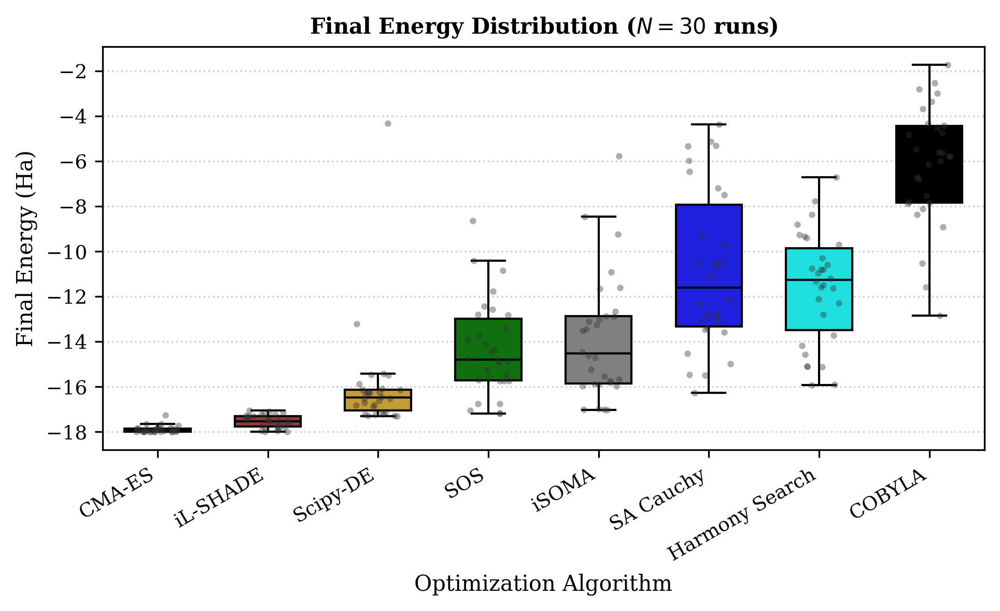

In [11]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import kruskal, mannwhitneyu

# --- SPRINGER PUBLICATION SETTINGS ---
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 9,
    "axes.labelsize": 10,
    "legend.fontsize": 8,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "figure.dpi": 300
})

# --- CONSISTENT STYLE & NAME MAPPING ---
STYLE_MAP = {
    "CMA-ES":     'orange',
    "Scipy-DE":   'goldenrod',
    "COBYLA":     'black',
    "SOS":        'green',
    "DevHS":      'cyan',
    "iSOMA":      'gray',
    "iL-SHADE":   'brown',
    "SA-Cauchy":  'blue',
}

PRETTY_NAMES = {
    "DevHS": "Harmony Search",
    "Scipy-DE": "Scipy-DE",
    "SA-Cauchy": "SA Cauchy"
}

def process_results(results_dir="results"):
    data_list = []
    optimizers = [d for d in os.listdir(results_dir) if os.path.isdir(os.path.join(results_dir, d))]
    
    for opt in optimizers:
        files = glob.glob(os.path.join(results_dir, opt, "run_*.csv"))
        for f in files:
            df = pd.read_csv(f)
            final_energy = df['Energy'].iloc[-1]
            data_list.append({'Optimizer': opt, 'Final_Energy': final_energy})
    
    results_df = pd.DataFrame(data_list)
    if results_df.empty: return

    # Map folder names to Pretty Names for the X-axis
    results_df['Display_Name'] = results_df['Optimizer'].map(lambda x: PRETTY_NAMES.get(x, x))
    
    # Sort by median for a professional look
    medians = results_df.groupby('Display_Name')['Final_Energy'].median().sort_values()
    order = medians.index

    # Create a palette dictionary based on our STYLE_MAP
    # We map Folder Name -> Color, then translate that to Pretty Name -> Color
    palette = {PRETTY_NAMES.get(k, k): v for k, v in STYLE_MAP.items()}

    # --- VISUALIZATION ---
    # 6.5 inches is standard full-width for Springer; 3.25 for half-width.
    # Using 6.5 here to keep the labels readable.
    fig, ax = plt.subplots(figsize=(6.5, 4.0))
    
    # Boxplot with thinner lines for scientific style
    sns.boxplot(
        x='Display_Name', 
        y='Final_Energy', 
        data=results_df, 
        order=order, 
        palette=palette,
        width=0.6,
        linewidth=1.0,
        fliersize=0, # Remove outliers from boxplot to avoid double-plotting with stripplot
        ax=ax
    )
    
    # Overlay individual data points (jittered)
    sns.stripplot(
        x='Display_Name', 
        y='Final_Energy', 
        data=results_df, 
        order=order, 
        color=".2", 
        size=3, 
        alpha=0.4, 
        jitter=0.2,
        ax=ax
    )
    
    # Formatting
    ax.set_title(f"Final Energy Distribution ($N=30$ runs)", fontsize=10, fontweight='bold')
    ax.set_ylabel("Final Energy (Ha)")
    ax.set_xlabel("Optimization Algorithm")
    
    # Log scale is often better for VQE/Hubbard error distributions
    # ax.set_yscale('log') 
    
    plt.grid(axis='y', linestyle=':', alpha=0.6)
    plt.xticks(rotation=30, ha='right')
    
    plt.tight_layout()
    
    # Save as PDF for vector graphics (Best for Springer)
    plt.savefig("hubbard_energy_distribution.pdf", bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    process_results()

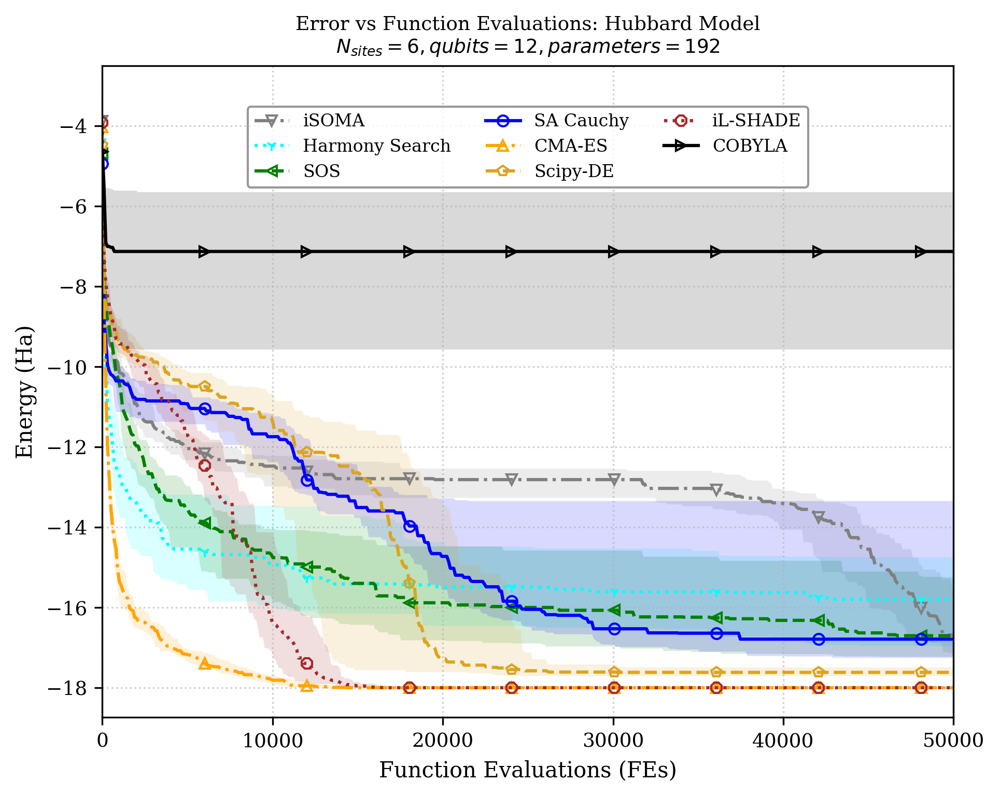

In [19]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- SPRINGER PUBLICATION SETTINGS ---
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 9,
    "axes.labelsize": 10,
    "legend.fontsize": 8,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "figure.dpi": 300
})

# --- STYLE MAPPING ---
# Key MUST match your folder name exactly
STYLE_MAP = {
    "CMA-ES":     ('orange', '-.', '^'),
    "Scipy-DE":   ('goldenrod', '--', 'p'), # Mapped from your 'de_bin' style
    "COBYLA":     ('black', '-', '>'),
    "SOS":        ('green', '--', '<'),
    "DevHS":      ('cyan', ':', '1'),     # Mapped to Harmony Search
    "iSOMA":      ('gray', '-.', 'v'),
    "iL-SHADE":   ('brown', ':', '8'),
    "SA-Cauchy":  ('blue', '-', 'o'),
}

# --- LEGEND LABEL MAPPING ---
# How you want the folder name to appear in the legend
PRETTY_NAMES = {
    "DevHS": "Harmony Search",
    "Scipy-DE": "Scipy-DE", # or "DEbest1bin" per your previous code
    "SA-Cauchy": "SA Cauchy"
}

def plot_convergence(results_dir="results", max_fe=50000):
    if not os.path.exists(results_dir):
        print(f"Directory '{results_dir}' not found.")
        return

    plt.figure(figsize=(6.5, 5.2))
    fe_grid = np.linspace(1, max_fe, 500)
    
    # Get subdirectories
    optimizers = [d for d in os.listdir(results_dir) 
                  if os.path.isdir(os.path.join(results_dir, d))]

    for opt in optimizers:
        files = glob.glob(os.path.join(results_dir, opt, "run_*.csv"))
        if not files:
            continue
            
        # Get styles or default to gray/solid if not found
        color, ls, marker = STYLE_MAP.get(opt, ('gray', '-', 'x'))
        # Get pretty name for legend, fallback to folder name
        display_name = PRETTY_NAMES.get(opt, opt)
        
        all_runs_energy = []
        for f in files:
            try:
                df = pd.read_csv(f)
                # Ensure we handle the non-increasing nature of optimization
                best_so_far = df['Energy'].cummin()
                interp_energy = np.interp(fe_grid, df['FE'], best_so_far)
                all_runs_energy.append(interp_energy)
            except Exception as e:
                print(f"Error loading {f}: {e}")
        
        if not all_runs_energy:
            continue

        all_runs_energy = np.array(all_runs_energy)
        median_curve = np.median(all_runs_energy, axis=0)
        lower_bound = np.percentile(all_runs_energy, 25, axis=0)
        upper_bound = np.percentile(all_runs_energy, 75, axis=0)
        
        # Plotting with the 'display_name' for the legend
        plt.plot(fe_grid, median_curve, 
                 label=display_name, 
                 color=color, 
                 linestyle=ls, 
                 marker=marker,
                 linewidth=1.5,
                 markevery=60, 
                 markersize=5, 
                 fillstyle='none')
        
        plt.fill_between(fe_grid, lower_bound, upper_bound, 
                         color=color, alpha=0.15, linewidth=0)

    # Formatting
    #plt.yscale('log')
    plt.xlabel('Function Evaluations (FEs)')
    plt.ylabel('Energy (Ha)')
    plt.title('Error vs Function Evaluations: Hubbard Model\n$N_{sites}=6, qubits=12, parameters=192$', fontsize=9)

    # Legend at bottom center
    plt.legend(loc='lower center', bbox_to_anchor=(0.5, 0.8), 
               ncol=3, frameon=True, edgecolor='gray', fontsize=8)

    plt.grid(True, which="both", linestyle=':', alpha=0.6)
    plt.xlim(0, max_fe)
    #plt.ylim(bottom=10**-1.5) 

    plt.tight_layout()
    plt.savefig("hubbard_final_report.pdf", bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    plot_convergence(max_fe=50000)

/tmp/ipykernel_9302/1853703266.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Optimizer', y='Final_Energy', data=df_res, order=order,



Optimizer            | Median       | p-value (vs Best)
-------------------------------------------------------
CMA-ES               | -18.000000   | ---
iL-SHADE             | -18.000000   | 1.0000e+00
Scipy-DE             | -17.617188   | 1.1960e-12
SA Cauchy            | -16.789062   | 1.2098e-12
SOS                  | -16.703125   | 4.5700e-12
iSOMA                | -16.687500   | 1.2108e-12
Harmony Search       | -15.796875   | 1.2108e-12
COBYLA               | -7.125000    | 1.2108e-12

Final PDF saved as 'hubbard_stats_final.pdf'


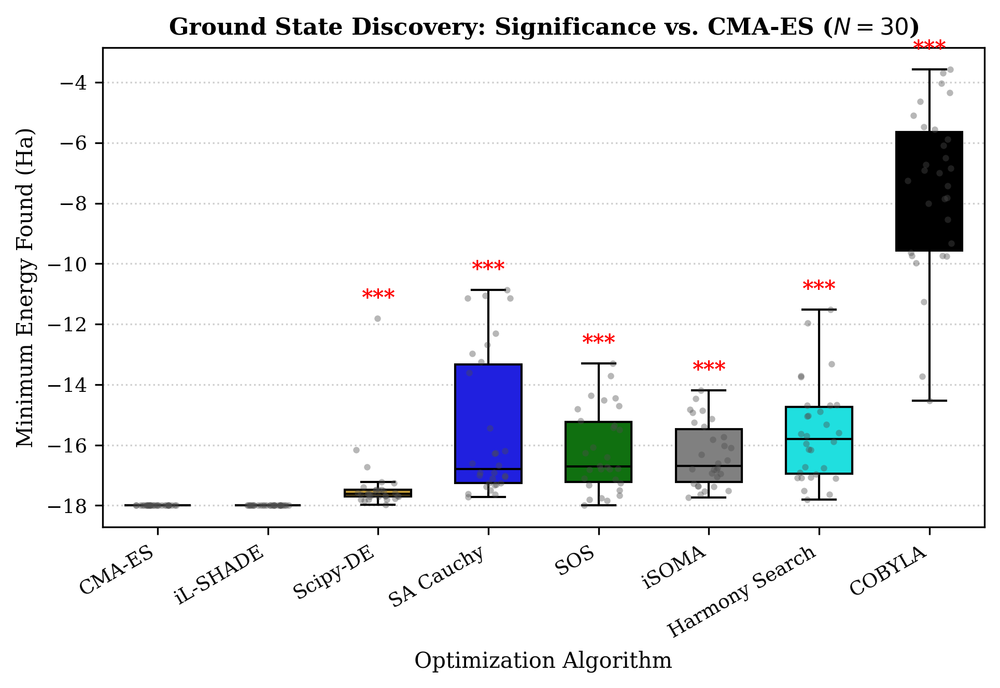

In [16]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# --- SPRINGER PUBLICATION SETTINGS ---
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 9,
    "axes.labelsize": 10,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "figure.dpi": 300
})

# --- MAPPING CONFIGURATION ---
PRETTY_NAMES = {
    "DevHS": "Harmony Search",
    "Scipy-DE": "Scipy-DE",
    "SA-Cauchy": "SA Cauchy"
}

STYLE_MAP = {
    "CMA-ES":     'orange',
    "Scipy-DE":   'goldenrod',
    "COBYLA":     'black',
    "SOS":        'green',
    "DevHS":      'cyan',
    "iSOMA":      'gray',
    "iL-SHADE":   'brown',
    "SA-Cauchy":  'blue',
}

def process_results(results_dir="results"):
    data_list = []
    if not os.path.exists(results_dir):
        print(f"Directory '{results_dir}' not found.")
        return

    optimizers = [d for d in os.listdir(results_dir) if os.path.isdir(os.path.join(results_dir, d))]
    
    for opt in optimizers:
        files = glob.glob(os.path.join(results_dir, opt, "run_*.csv"))
        for f in files:
            df = pd.read_csv(f)
            # Take global minimum found in the run
            best_energy = df['Energy'].min() 
            # Use the pretty name if available, otherwise keep folder name
            display_name = PRETTY_NAMES.get(opt, opt)
            data_list.append({'Optimizer': display_name, 'Final_Energy': best_energy, 'RawName': opt})
    
    df_res = pd.DataFrame(data_list)
    
    # 1. Determine "Best" by Median
    medians = df_res.groupby('Optimizer')['Final_Energy'].median().sort_values()
    best_opt = medians.index[0]
    best_vals = df_res[df_res['Optimizer'] == best_opt]['Final_Energy']

    # 2. Visuals
    fig, ax = plt.subplots(figsize=(6.5, 4.5))
    order = medians.index
    
    # Generate palette using the RawName mapping to ensure color consistency
    palette = {PRETTY_NAMES.get(k, k): v for k, v in STYLE_MAP.items()}

    sns.boxplot(x='Optimizer', y='Final_Energy', data=df_res, order=order, 
                palette=palette, ax=ax, fliersize=0, width=0.6, linewidth=1.0)
    
    sns.stripplot(x='Optimizer', y='Final_Energy', data=df_res, order=order, 
                  color=".3", size=3, alpha=0.4, jitter=0.2, ax=ax)

    # 3. Statistical Annotation & Print Table
    y_min, y_max = df_res['Final_Energy'].min(), df_res['Final_Energy'].max()
    y_range = y_max - y_min
    
    print(f"\n{'Optimizer':<20} | {'Median':<12} | {'p-value (vs Best)'}")
    print("-" * 55)

    for i, opt in enumerate(order):
        opt_vals = df_res[df_res['Optimizer'] == opt]['Final_Energy']
        stat, p_val = mannwhitneyu(best_vals, opt_vals, alternative='two-sided')
        
        # Print for Table
        p_str = f"{p_val:.4e}" if opt != best_opt else "---"
        print(f"{opt:<20} | {medians[opt]:<12.6f} | {p_str}")

        # Annotate Plot with significance stars
        if opt != best_opt:
            label = ""
            if p_val < 0.001: label = "***"
            elif p_val < 0.01: label = "**"
            elif p_val < 0.05: label = "*"
            
            if label:
                # Calculate height for text: slightly above the highest point for this optimizer
                ax.text(i, opt_vals.max() + (y_range * 0.02), label, 
                        ha='center', va='bottom', color='red', fontweight='bold', fontsize=10)

    # Final Formatting
    ax.set_title(f"Ground State Discovery: Significance vs. {best_opt} ($N=30$)", fontweight='bold')
    ax.set_ylabel("Minimum Energy Found (Ha)")
    ax.set_xlabel("Optimization Algorithm")
    
    plt.grid(axis='y', linestyle=':', alpha=0.6)
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    
    plt.savefig("hubbard_stats_final.pdf", bbox_inches='tight')
    print(f"\nFinal PDF saved as 'hubbard_stats_final.pdf'")
    plt.show()

if __name__ == "__main__":
    process_results()

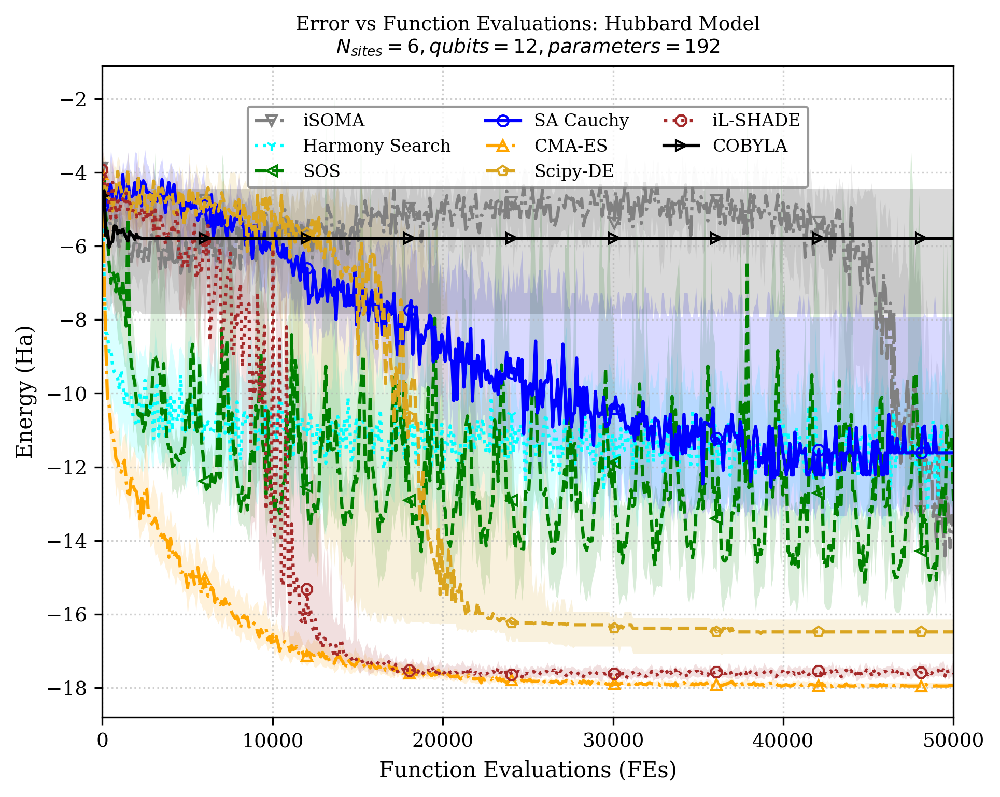

In [18]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- SPRINGER PUBLICATION SETTINGS ---
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 9,
    "axes.labelsize": 10,
    "legend.fontsize": 8,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "figure.dpi": 300
})

# --- STYLE MAPPING ---
# Key MUST match your folder name exactly
STYLE_MAP = {
    "CMA-ES":     ('orange', '-.', '^'),
    "Scipy-DE":   ('goldenrod', '--', 'p'), # Mapped from your 'de_bin' style
    "COBYLA":     ('black', '-', '>'),
    "SOS":        ('green', '--', '<'),
    "DevHS":      ('cyan', ':', '1'),       # Mapped to Harmony Search
    "iSOMA":      ('gray', '-.', 'v'),
    "iL-SHADE":   ('brown', ':', '8'),
    "SA-Cauchy":  ('blue', '-', 'o'),
}

# --- LEGEND LABEL MAPPING ---
# How you want the folder name to appear in the legend
PRETTY_NAMES = {
    "DevHS": "Harmony Search",
    "Scipy-DE": "Scipy-DE", # or "DEbest1bin" per your previous code
    "SA-Cauchy": "SA Cauchy"
}

def plot_convergence(results_dir="results", max_fe=50000):
    if not os.path.exists(results_dir):
        print(f"Directory '{results_dir}' not found.")
        return

    plt.figure(figsize=(6.5, 5.2))
    fe_grid = np.linspace(1, max_fe, 500)
    
    # Get subdirectories
    optimizers = [d for d in os.listdir(results_dir) 
                  if os.path.isdir(os.path.join(results_dir, d))]

    for opt in optimizers:
        files = glob.glob(os.path.join(results_dir, opt, "run_*.csv"))
        if not files:
            continue
            
        # Get styles or default to gray/solid if not found
        color, ls, marker = STYLE_MAP.get(opt, ('gray', '-', 'x'))
        # Get pretty name for legend, fallback to folder name
        display_name = PRETTY_NAMES.get(opt, opt)
        
        all_runs_energy = []
        for f in files:
            try:
                df = pd.read_csv(f)
                # MODIFICATION: Use raw energy directly instead of cumulative minimum
                raw_energy = df['Energy']
                interp_energy = np.interp(fe_grid, df['FE'], raw_energy)
                all_runs_energy.append(interp_energy)
            except Exception as e:
                print(f"Error loading {f}: {e}")
        
        if not all_runs_energy:
            continue

        all_runs_energy = np.array(all_runs_energy)
        median_curve = np.median(all_runs_energy, axis=0)
        lower_bound = np.percentile(all_runs_energy, 25, axis=0)
        upper_bound = np.percentile(all_runs_energy, 75, axis=0)
        
        # Plotting with the 'display_name' for the legend
        plt.plot(fe_grid, median_curve, 
                 label=display_name, 
                 color=color, 
                 linestyle=ls, 
                 marker=marker,
                 linewidth=1.5,
                 markevery=60, 
                 markersize=5, 
                 fillstyle='none')
        
        plt.fill_between(fe_grid, lower_bound, upper_bound, 
                         color=color, alpha=0.15, linewidth=0)

    # Formatting
    #plt.yscale('log')
    plt.xlabel('Function Evaluations (FEs)')
    plt.ylabel('Energy (Ha)')
    plt.title('Error vs Function Evaluations: Hubbard Model\n$N_{sites}=6, qubits=12, parameters=192$', fontsize=9)

    # Legend at bottom center
    plt.legend(loc='lower center', bbox_to_anchor=(0.5, 0.8), 
               ncol=3, frameon=True, edgecolor='gray', fontsize=8)

    plt.grid(True, which="both", linestyle=':', alpha=0.6)
    plt.xlim(0, max_fe)
    #plt.ylim(bottom=10**-1.5) 

    plt.tight_layout()
    plt.savefig("hubbard_final_report_raw.pdf", bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    plot_convergence(max_fe=50000)


Optimizer          | Median     | IQR        | Std        | Raw p-val    | FDR p-val
--------------------------------------------------------------------------------
CMA-ES             | -18.00000  | 0.00000    | 0.00000    | ---          | ---
iL-SHADE           | -18.00000  | 0.00000    | 0.00000    | 1.0000e+00   | 1.0000e+00
Scipy-DE           | -17.61719  | 0.21484    | 1.10319    | 1.1960e-12   | 1.6951e-12
SA Cauchy          | -16.78906  | 3.91016    | 2.38123    | 1.2098e-12   | 1.6951e-12
SOS                | -16.70312  | 1.98047    | 1.33590    | 4.5700e-12   | 5.3317e-12
iSOMA              | -16.68750  | 1.74609    | 1.04461    | 1.2108e-12   | 1.6951e-12
Harmony Search     | -15.79688  | 2.21484    | 1.60200    | 1.2108e-12   | 1.6951e-12
COBYLA             | -7.12500   | 3.92188    | 2.71823    | 1.2108e-12   | 1.6951e-12


/tmp/ipykernel_11660/3083885452.py:124: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Optimizer', y='Final_Energy', data=df_res, order=order,



Final PDF saved as 'hubbard_stats_final.pdf'


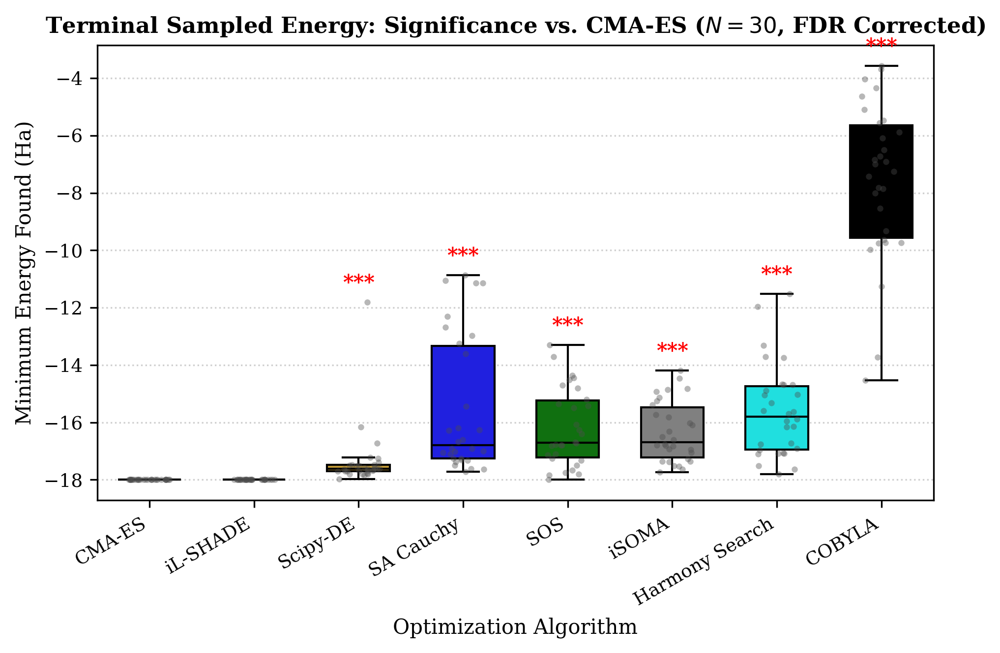

In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

# --- SPRINGER PUBLICATION SETTINGS ---
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 9,
    "axes.labelsize": 10,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "figure.dpi": 300
})

# --- MAPPING CONFIGURATION ---
PRETTY_NAMES = {
    "DevHS": "Harmony Search",
    "Scipy-DE": "Scipy-DE",
    "SA-Cauchy": "SA Cauchy"
}

STYLE_MAP = {
    "CMA-ES":     'orange',
    "Scipy-DE":   'goldenrod',
    "COBYLA":     'black',
    "SOS":        'green',
    "DevHS":      'cyan',
    "iSOMA":      'gray',
    "iL-SHADE":   'brown',
    "SA-Cauchy":  'blue',
}

def process_results(results_dir="results"):
    data_list = []
    if not os.path.exists(results_dir):
        print(f"Directory '{results_dir}' not found.")
        return

    optimizers = [d for d in os.listdir(results_dir) if os.path.isdir(os.path.join(results_dir, d))]
    
    for opt in optimizers:
        files = glob.glob(os.path.join(results_dir, opt, "run_*.csv"))
        for f in files:
            df = pd.read_csv(f)
            # Take global minimum found in the run
            best_energy = df['Energy'].min() 
            # Use the pretty name if available, otherwise keep folder name
            display_name = PRETTY_NAMES.get(opt, opt)
            data_list.append({'Optimizer': display_name, 'Final_Energy': best_energy, 'RawName': opt})
    
    if not data_list:
        print("No data found in csv files.")
        return

    df_res = pd.DataFrame(data_list)
    
    # 1. Determine "Best" by Median
    medians = df_res.groupby('Optimizer')['Final_Energy'].median().sort_values()
    best_opt = medians.index[0]
    best_vals = df_res[df_res['Optimizer'] == best_opt]['Final_Energy']

    # 2. Extract Data & Calculate Raw P-Values
    order = medians.index
    stats_data = []
    raw_p_values = []
    correction_indices = []

    for i, opt in enumerate(order):
        opt_vals = df_res[df_res['Optimizer'] == opt]['Final_Energy']
        
        # Calculate variability measures for Reviewer 4
        iqr_val = np.percentile(opt_vals, 75) - np.percentile(opt_vals, 25)
        std_val = opt_vals.std()
        
        if opt != best_opt:
            stat, p_val = mannwhitneyu(best_vals, opt_vals, alternative='two-sided')
            raw_p_values.append(p_val)
            correction_indices.append(i)
        else:
            p_val = np.nan # No p-value for the control against itself
            
        stats_data.append({
            'Optimizer': opt,
            'Median': medians[opt],
            'IQR': iqr_val,
            'Std': std_val,
            'Raw_p': p_val,
            'Corr_p': np.nan, # Placeholder
            'Vals': opt_vals
        })

    # 3. Apply Benjamini-Hochberg FDR Correction
    if raw_p_values:
        reject, pvals_corrected, _, _ = multipletests(raw_p_values, alpha=0.05, method='fdr_bh')
        for idx, corr_p in zip(correction_indices, pvals_corrected):
            stats_data[idx]['Corr_p'] = corr_p

    # 4. Print Table with Variability and Corrected P-values
    print(f"\n{'Optimizer':<18} | {'Median':<10} | {'IQR':<10} | {'Std':<10} | {'Raw p-val':<12} | {'FDR p-val'}")
    print("-" * 80)
    
    for item in stats_data:
        opt = item['Optimizer']
        med = item['Median']
        iqr = item['IQR']
        std = item['Std']
        
        if opt == best_opt:
            print(f"{opt:<18} | {med:<10.5f} | {iqr:<10.5f} | {std:<10.5f} | {'---':<12} | {'---'}")
        else:
            print(f"{opt:<18} | {med:<10.5f} | {iqr:<10.5f} | {std:<10.5f} | {item['Raw_p']:<12.4e} | {item['Corr_p']:.4e}")

    # 5. Visuals
    fig, ax = plt.subplots(figsize=(6.5, 4.5))
    
    # Generate palette using the RawName mapping to ensure color consistency
    palette = {PRETTY_NAMES.get(k, k): v for k, v in STYLE_MAP.items()}

    sns.boxplot(x='Optimizer', y='Final_Energy', data=df_res, order=order, 
                palette=palette, ax=ax, fliersize=0, width=0.6, linewidth=1.0)
    
    sns.stripplot(x='Optimizer', y='Final_Energy', data=df_res, order=order, 
                  color=".3", size=3, alpha=0.4, jitter=0.2, ax=ax)

    # 6. Statistical Annotation (Using Corrected P-Values)
    y_min, y_max = df_res['Final_Energy'].min(), df_res['Final_Energy'].max()
    y_range = y_max - y_min
    
    for i, item in enumerate(stats_data):
        opt = item['Optimizer']
        if opt != best_opt:
            corr_p = item['Corr_p']
            label = ""
            # Apply stars based on the corrected p-values
            if corr_p < 0.001: label = "***"
            elif corr_p < 0.01: label = "**"
            elif corr_p < 0.05: label = "*"
            
            if label:
                # Calculate height for text: slightly above the highest point for this optimizer
                ax.text(i, item['Vals'].max() + (y_range * 0.02), label, 
                        ha='center', va='bottom', color='red', fontweight='bold', fontsize=10)

    # Final Formatting
    ax.set_title(f"Terminal Sampled Energy: Significance vs. {best_opt} ($N=30$, FDR Corrected)", fontweight='bold')
    ax.set_ylabel("Minimum Energy Found (Ha)")
    ax.set_xlabel("Optimization Algorithm")
    
    plt.grid(axis='y', linestyle=':', alpha=0.6)
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    
    plt.savefig("hubbard_stats_final.pdf", bbox_inches='tight')
    print(f"\nFinal PDF saved as 'hubbard_stats_final.pdf'")
    plt.show()

if __name__ == "__main__":
    process_results()